In [1]:
%load_ext autoreload
%autoreload 2

In [1130]:
import psfmachine as psf
import lightkurve as lk
import numpy as np
import matplotlib.pyplot as plt
lk.log.setLevel('WARNING')

plt.style.use('seaborn-white')

In [1131]:
tpfs = lk.search_targetpixelfile('Kepler-16', mission='Kepler', quarter=12, radius=1000, limit=200, cadence='long').download_all(quality_bitmask=None)
#tpfs = lk.search_targetpixelfile('KOI-608', mission='Kepler', quarter=10, radius=1000, limit=200).download_all()
#tpfs = lk.search_targetpixelfile('KIC 8495232', mission='Kepler', quarter=10, radius=1000, limit=200)

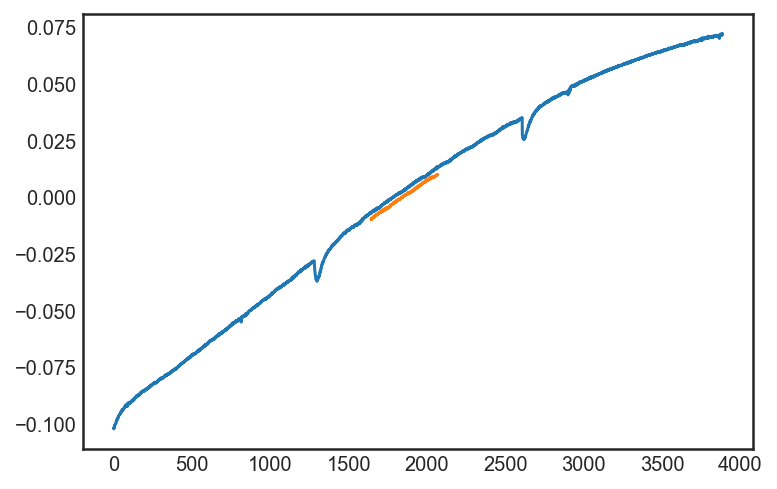

In [1132]:
# Find frames that are well aligned with the mean frame
p1, p2 = tpfs[0].pos_corr1, tpfs[1].pos_corr1
k = (np.abs(p1) < 10) & (np.abs(p2) < 10)
p1 -= p1[k].min()
p2 -= p2[k].min()
arc = np.hypot(p1, p2)
plt.plot(arc[k] - arc[k].mean())
time_mask = np.abs(arc - arc[k].mean()) < 0.01
plt.plot(np.where(time_mask)[0], (arc - arc[k].mean())[time_mask])

In [1441]:
# get rid of saturated TPFs
self = psf.TPFMachine.from_TPFs(tpfs, magnitude_limit=20, dr=3, n_r_knots=10, n_phi_knots=12, time_mask=time_mask)

/Users/ch/Projects/ADAP/science/psf-modeling/psfmachine/psfmachine/tpf.py:300: LightkurveDeprecationWarning: The header function is deprecated and may be removed in a future version.
        Use get_header() instead.
  tpf_meta["tpfmag"] = [tpf.header["kepmag"] for tpf in tpfs]
<__array_function__ internals>:5: RuntimeWarning: All-NaN axis encountered


In [1442]:
self.fit_lightcurves()

/Users/ch/Projects/ADAP/science/psf-modeling/psfmachine/psfmachine/machine.py:302: RuntimeWarning: divide by zero encountered in log10
  f = np.log10((temp_mask.astype(float) * mean_flux))
/Users/ch/Projects/ADAP/science/psf-modeling/psfmachine/psfmachine/machine.py:302: RuntimeWarning: invalid value encountered in log10
  f = np.log10((temp_mask.astype(float) * mean_flux))
/Users/ch/Projects/ADAP/science/psf-modeling/psfmachine/psfmachine/machine.py:388: RuntimeWarning: divide by zero encountered in log10
  mean_f = np.log10(
/Users/ch/Projects/ADAP/science/psf-modeling/psfmachine/psfmachine/machine.py:766: RuntimeWarning: divide by zero encountered in log10
  mean_f = np.log10(
/Users/ch/Projects/ADAP/science/psf-modeling/psfmachine/psfmachine/machine.py:782: RuntimeWarning: invalid value encountered in sqrt
  .multiply((f ** 0.5) / (f * np.log(10)))
/Users/ch/Library/Caches/pypoetry/virtualenvs/psfmachine-oTpW04dh-py3.8/lib/python3.8/site-packages/scipy/sparse/_index.py:125: SparseE

/Users/ch/Projects/ADAP/science/psf-modeling/psfmachine/psfmachine/machine.py:916: RuntimeWarning: divide by zero encountered in log10
  def plot_shape_model(self, radius=20):


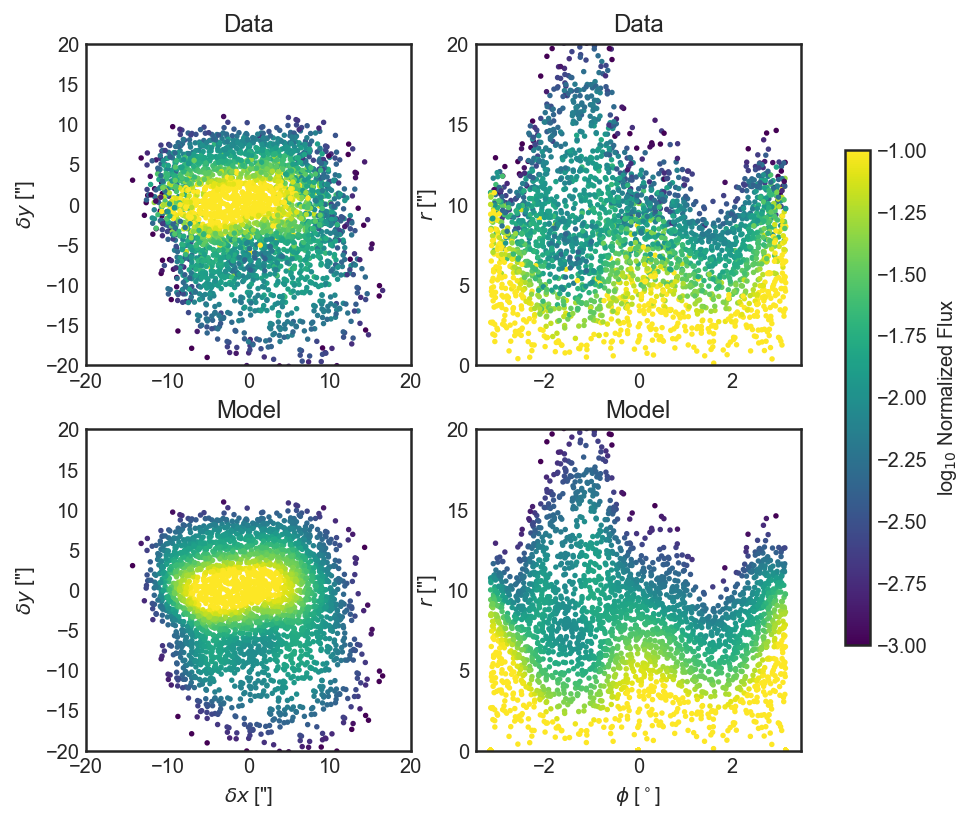

In [1443]:
self.plot_shape_model();

/Users/ch/Projects/ADAP/science/psf-modeling/psfmachine/psfmachine/machine.py:577: RuntimeWarning: invalid value encountered in true_divide
  fem /= np.nanmean(fm, axis=0)
/Users/ch/Projects/ADAP/science/psf-modeling/psfmachine/psfmachine/machine.py:578: RuntimeWarning: invalid value encountered in true_divide
  fm /= np.nanmean(fm, axis=0)


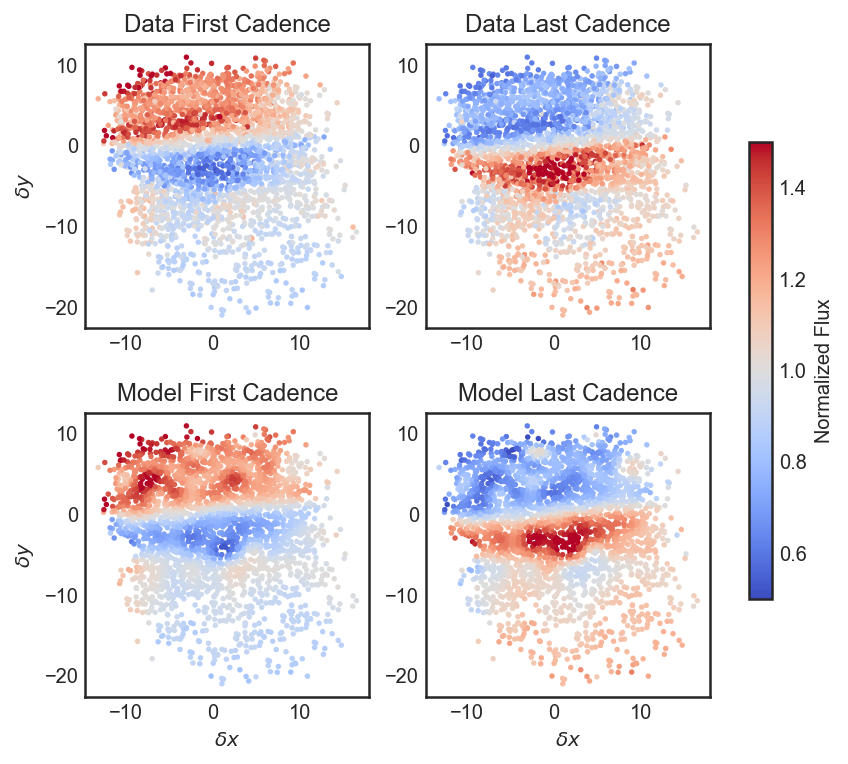

In [1444]:
self.plot_time_model();

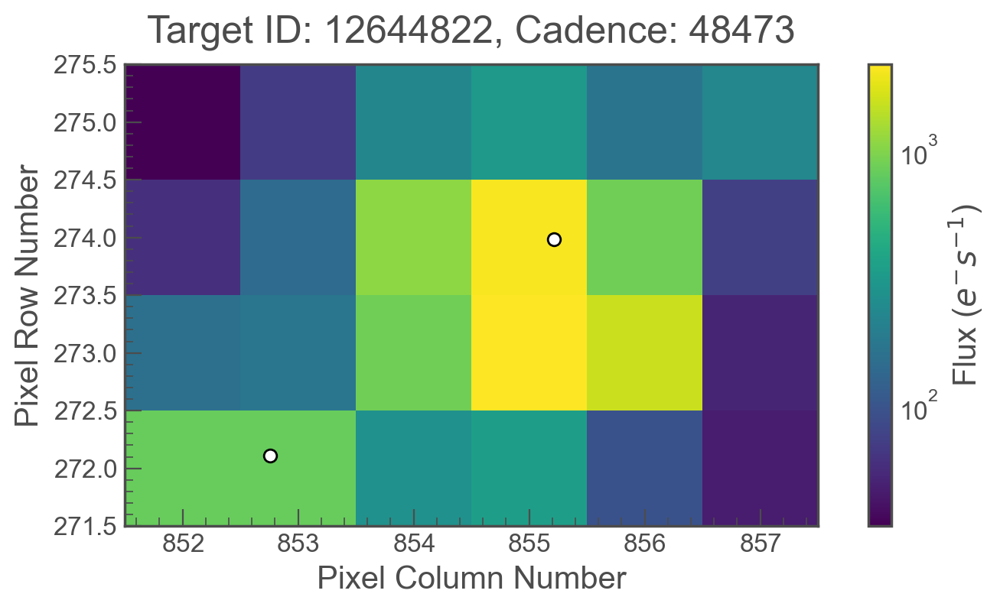

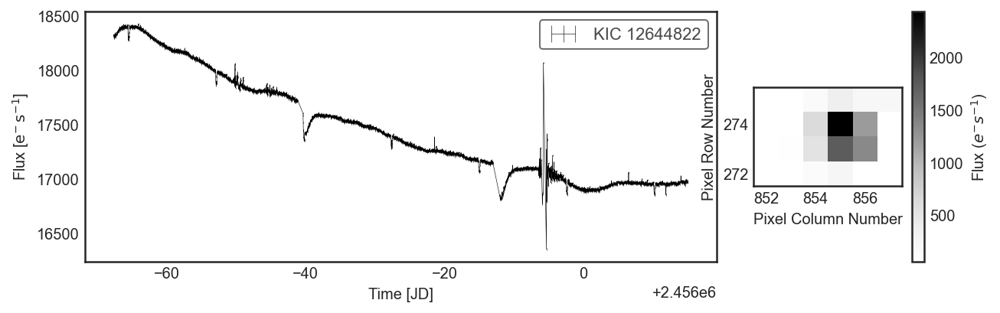

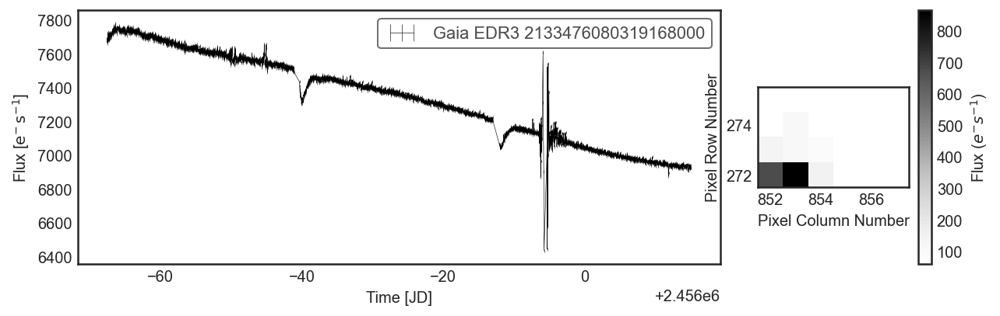

In [1446]:
self.plot_tpf(4)

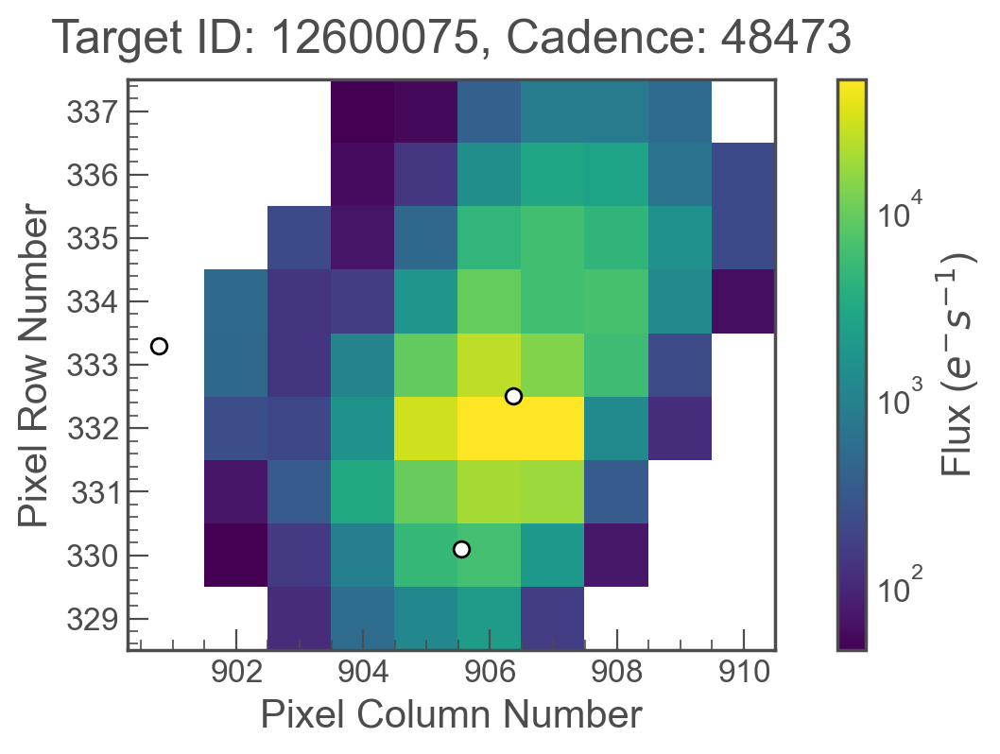

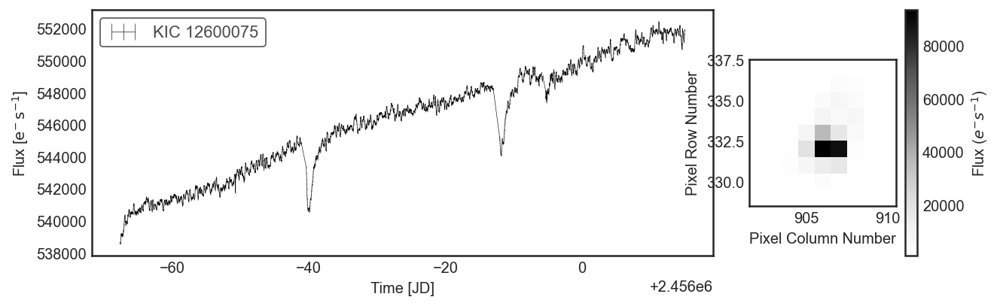

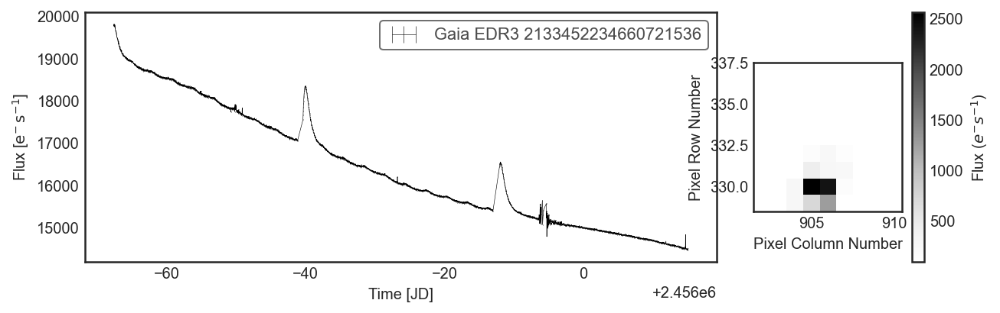

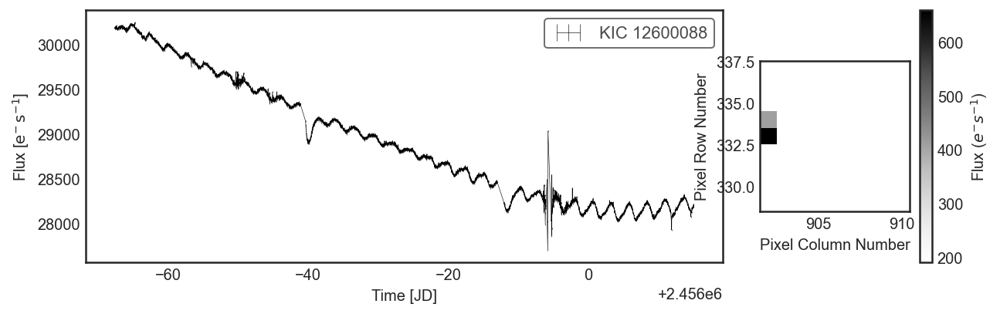

In [1447]:
self.plot_tpf(34)

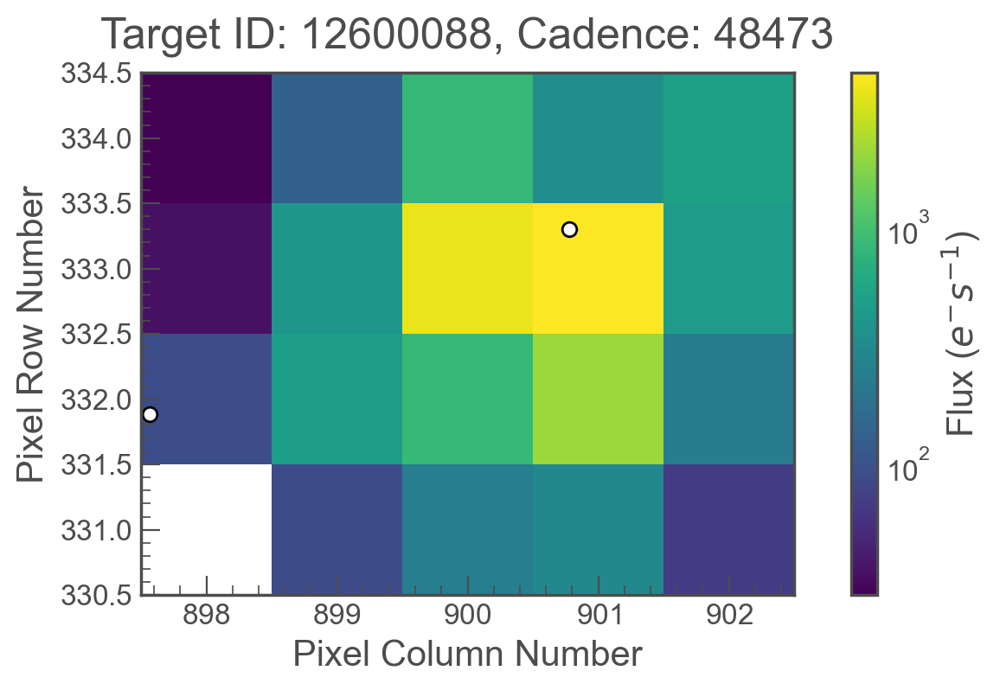

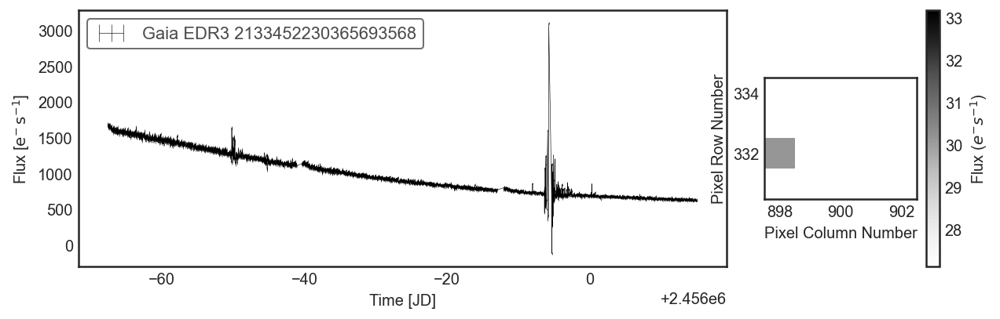

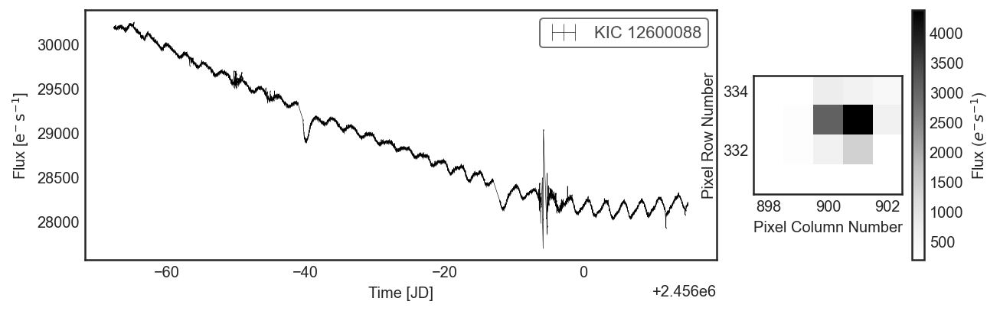

In [1448]:
self.plot_tpf(32)

In [1452]:
fresh = lk.LightCurveCollection([lc for lc in self.lcs if lc.label.startswith('Gaia')])

/Users/ch/Library/Caches/pypoetry/virtualenvs/psfmachine-oTpW04dh-py3.8/lib/python3.8/site-packages/lightkurve/lightcurve.py:1650: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1)


[<AxesSubplot:xlabel='Time [JD]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>,
 <AxesSubplot:xlabel='Time [JD]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>,
 <AxesSubplot:xlabel='Time [JD]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>,
 <AxesSubplot:xlabel='Time [JD]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>,
 <AxesSubplot:xlabel='Time [JD]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>,
 <AxesSubplot:xlabel='Time [JD]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>,
 <AxesSubplot:xlabel='Time [JD]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>,
 <AxesSubplot:xlabel='Time [JD]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>,
 <AxesSubplot:xlabel='Time [JD]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>,
 <AxesSubplot:xlabel='Time [JD]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>,
 <AxesSubplot:xlabel='Time [JD]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>,
 <AxesSubplot:xlabel='Time [JD]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>,
 <AxesSubplot:xlabel='Time [JD]', ylabel='Flux [$\\m

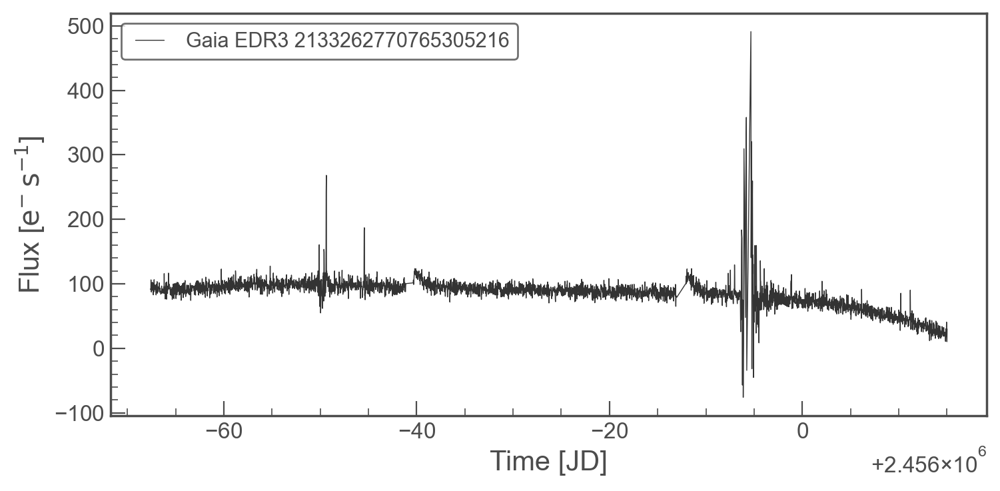

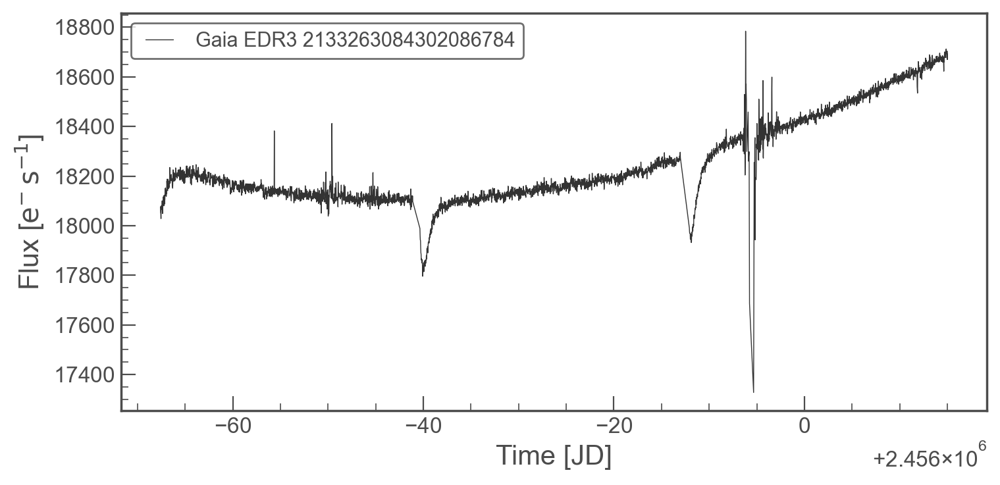

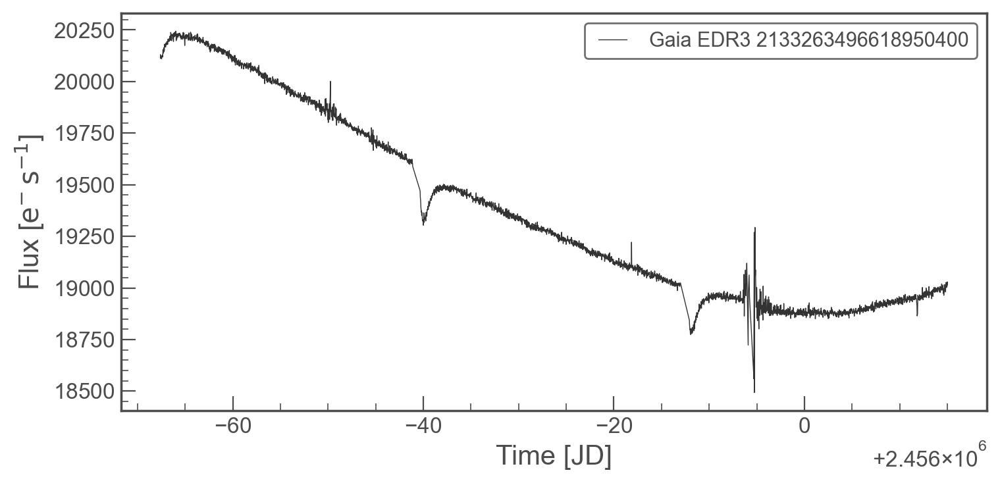

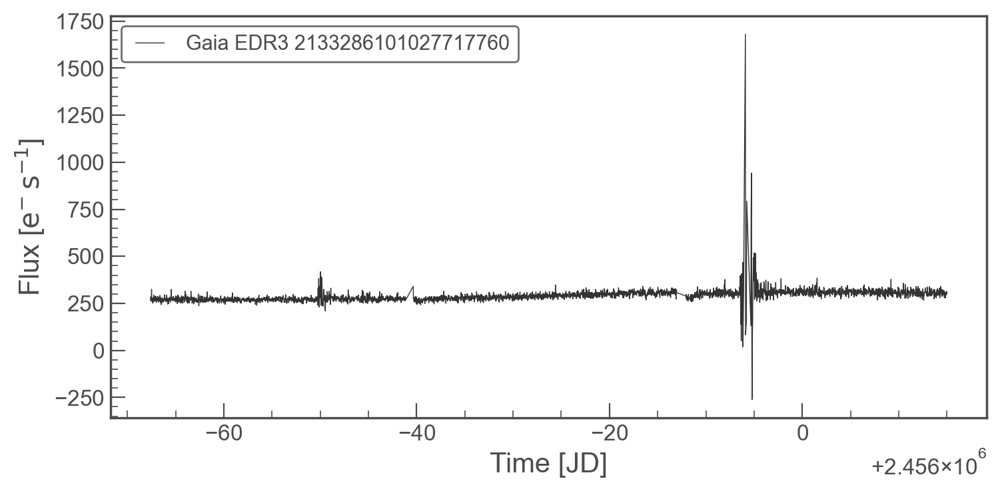

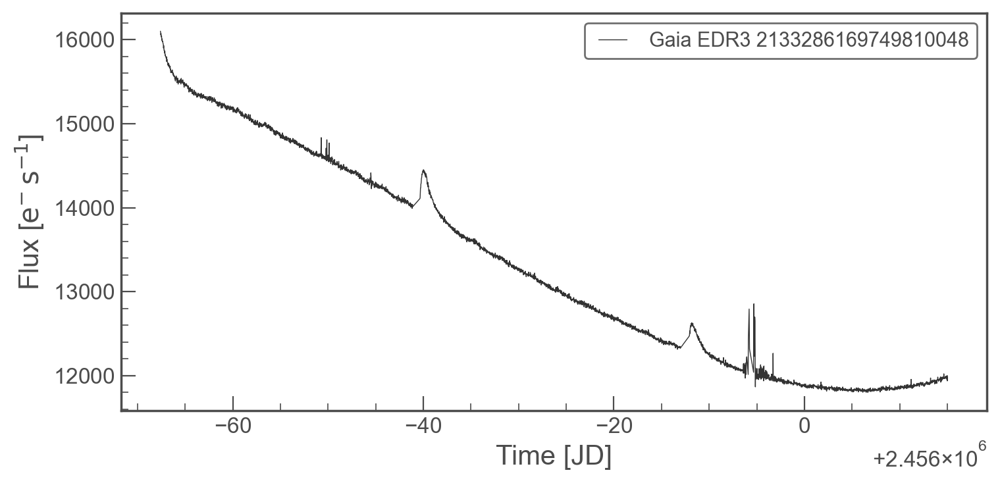

...

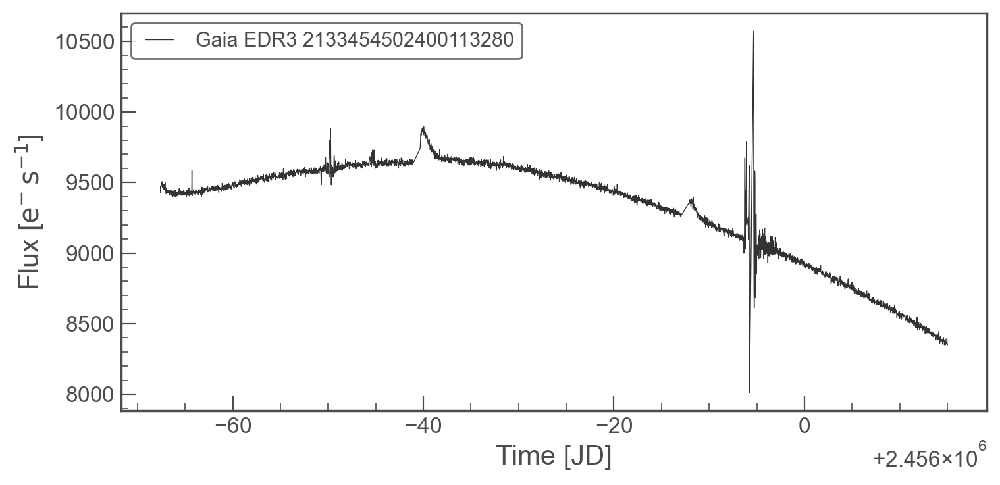

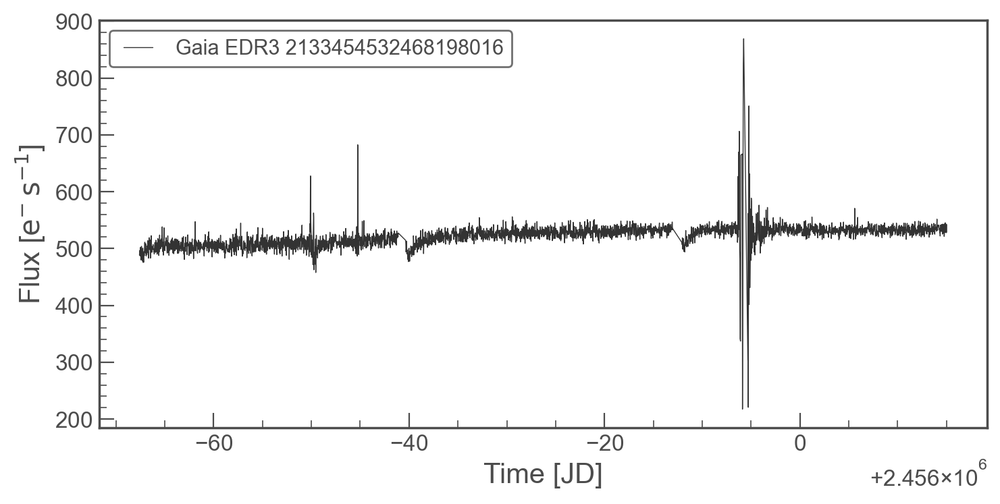

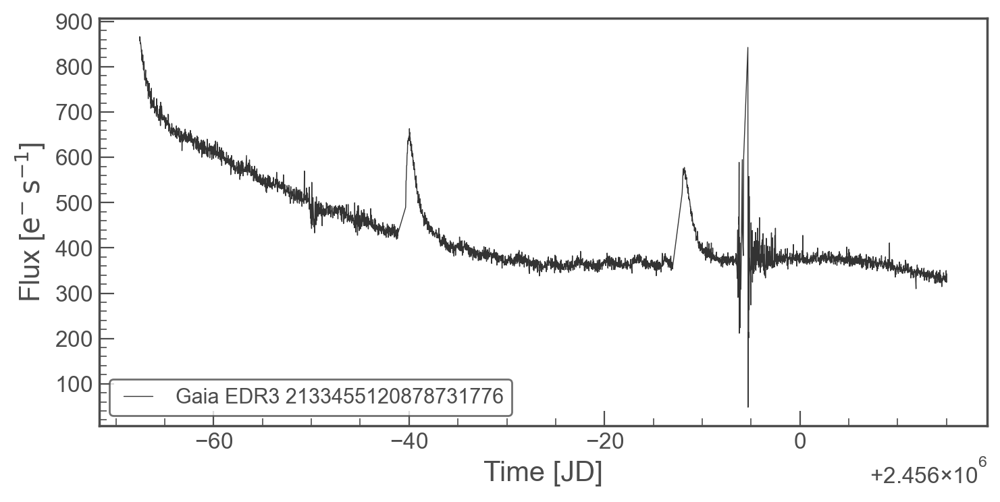

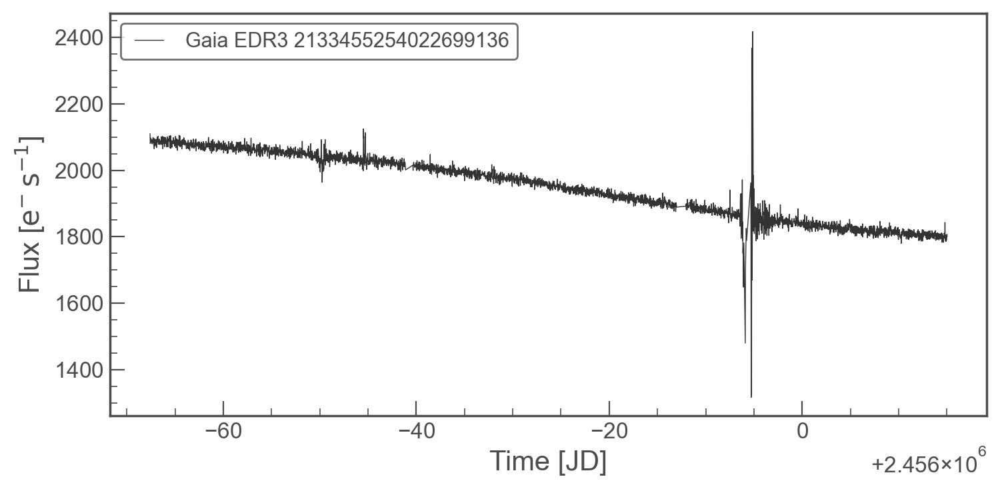

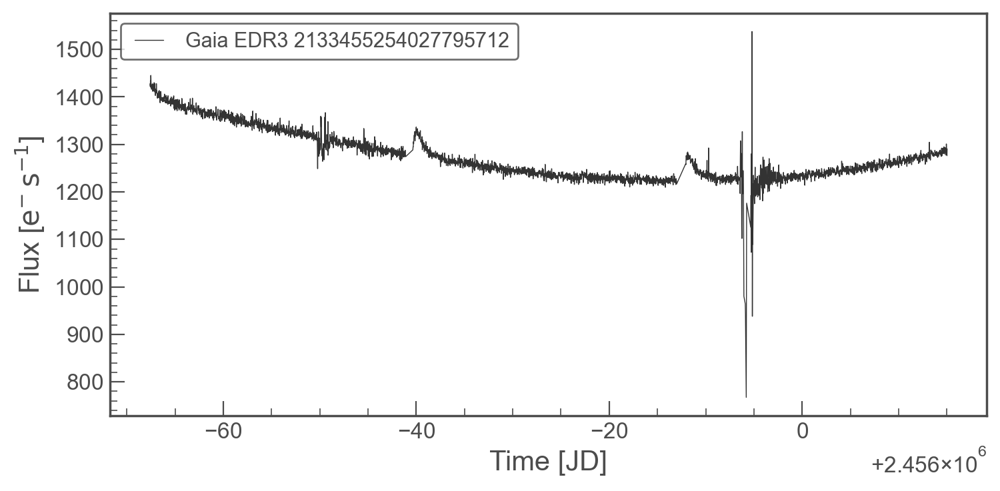

In [1474]:
[lc.plot() for lc in fresh[:100] if np.isfinite(lc.flux).all()]

410

In [1273]:
isinstance(1, (int, float))

True

(0.99, 1.003)

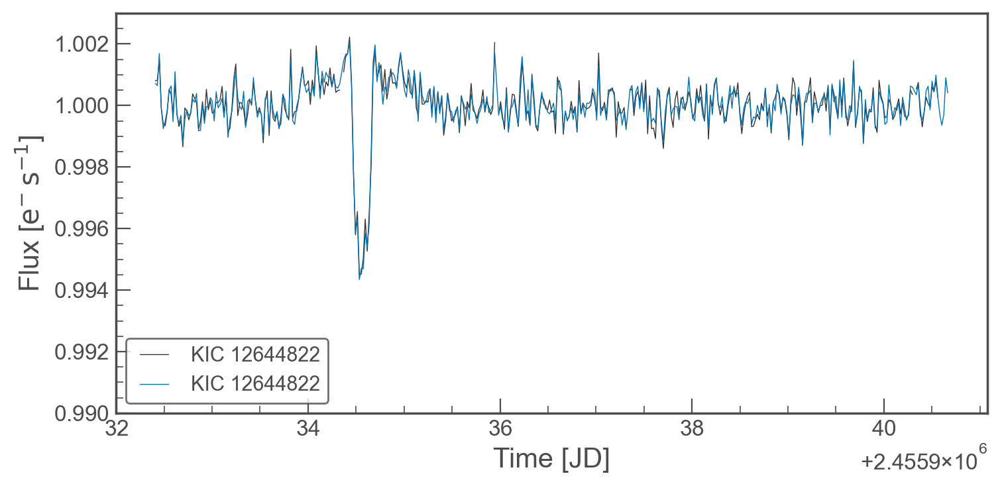

In [1227]:
rlc = tpfs[4].to_lightcurve().flatten(101, sigma=100)

rlc.time += 2454833
ax = rlc[:400].plot()
self.lcs_in_tpf(4)[0].flatten(101, sigma=100)[:400].plot(ax=ax)
plt.ylim(0.99, 1.003)

True

In [1109]:
lk.log.setLevel("DEBUG")

In [1113]:
tpfs = lk.search_targetpixelfile('KIC 8495232', mission='Kepler', quarter=10).download()

Started downloading http://archive.stsci.edu/missions/kepler/lightcurves/0084/008495232/kplr008495232_lc_Q111111111111111111.tar.
DEBUG:lightkurve.search:Started downloading http://archive.stsci.edu/missions/kepler/lightcurves/0084/008495232/kplr008495232_lc_Q111111111111111111.tar.
Finished downloading.
DEBUG:lightkurve.search:Finished downloading.
Opening /Users/ch/.lightkurve-cache/mastDownload/Kepler/kplr008495232_lc_Q111111111111111111/kplr008495232-2011271113734_lpd-targ.fits.gz.
DEBUG:lightkurve.io.read:Opening /Users/ch/.lightkurve-cache/mastDownload/Kepler/kplr008495232_lc_Q111111111111111111/kplr008495232-2011271113734_lpd-targ.fits.gz.
Detected filetype: 'KeplerTargetPixelFile'.
DEBUG:lightkurve.io.read:Detected filetype: 'KeplerTargetPixelFile'.
3% (126/4573) of the cadences will be ignored due to the quality mask (quality_bitmask=1130799).
INFO:lightkurve.utils:3% (126/4573) of the cadences will be ignored due to the quality mask (quality_bitmask=1130799).


NameError: name 'Observations' is not defined

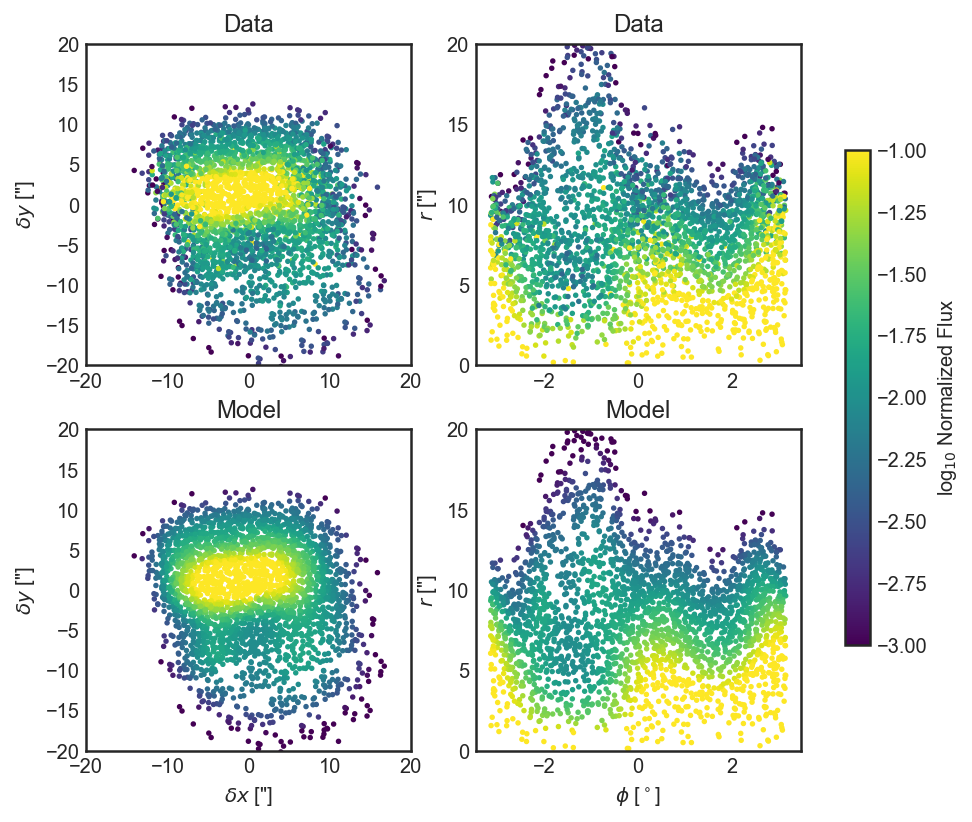

In [1085]:
self.plot_shape_model();

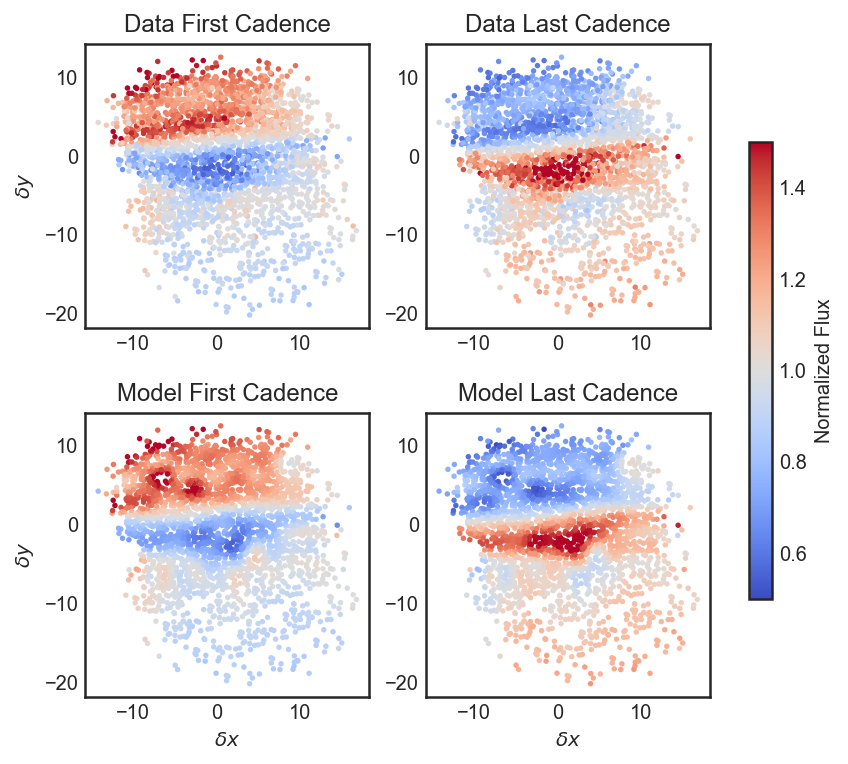

In [1086]:
self.plot_time_model();

In [1087]:
np.where((self.ws_va < 0).all(axis=0))[0]

array([], dtype=int64)

(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.]),
 array([0.        , 0.31578947, 0.63157895, 0.94736842, 1.26315789,
        1.57894737, 1.89473684, 2.21052632, 2.52631579, 2.84210526,
        3.15789474, 3.47368421, 3.78947368, 4.10526316, 4.42105263,
        4.73684211, 5.05263158, 5.36842105, 5.68421053, 6.        ]),
 <BarContainer object of 19 artists>)

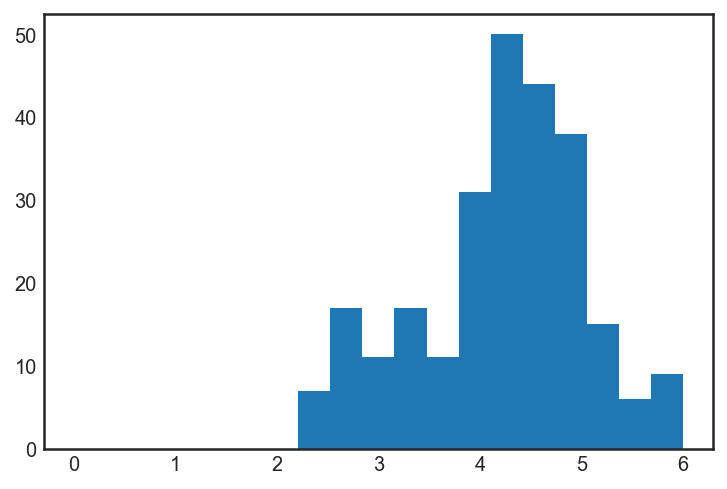

In [1088]:
plt.hist(np.log10(self.sources.phot_g_mean_flux[np.where((self.ws_va > 0).all(axis=0))[0]]), np.linspace(0, 6, 20))
plt.hist(np.log10(self.sources.phot_g_mean_flux[np.where((self.ws_va < 0).all(axis=0))[0]]), np.linspace(0, 6, 20))


[100 102]


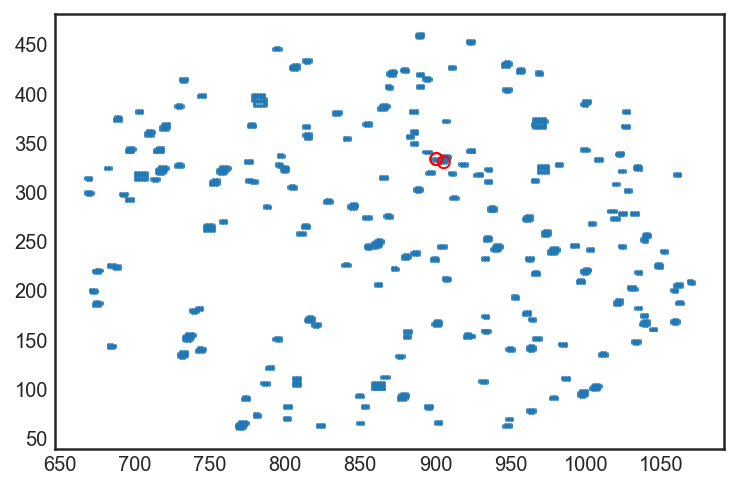

In [1103]:
tdx = np.where([100 in s for s in self.tpf_meta['sources']])[0][0]
print(self.tpf_meta['sources'][tdx])
fig, ax = plt.subplots()
ax.scatter(self.column, self.row, s=0.1)
sources = get_gaia_sources(tpfs[tdx].ra, tpfs[tdx].dec, 0.01)
for idx, s in sources.iterrows():
    col, row = tpfs[tdx].wcs.all_world2pix([[s.ra, s.dec]], 0)[0]

    if (col < -3) | (col > (tpfs[tdx].shape[2] + 3)) |  (row < -3) | (row > (tpfs[tdx].shape[1] + 3)):
        continue
    ax.scatter(col+tpfs[tdx].column, row+tpfs[tdx].row, facecolor='None', edgecolor='r')

100
102


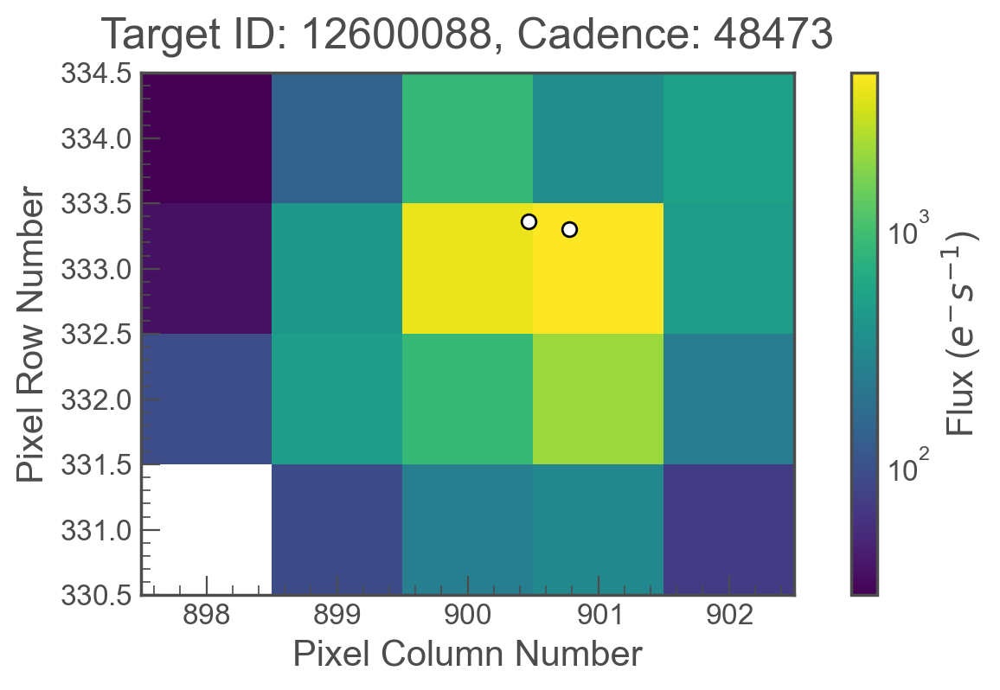

In [1104]:
ax = tpfs[tdx].plot(scale='log')
sources = self.sources.loc[self.tpf_meta['sources'][tdx]]
for idx, s in sources.iterrows():
    col, row = tpfs[tdx].wcs.all_world2pix([[s.ra, s.dec]], 0)[0]
    if (col < -3) | (col > (tpfs[tdx].shape[2] + 3)) |  (row < -3) | (row > (tpfs[tdx].shape[1] + 3)):
        continue
    ax.scatter(col+tpfs[tdx].column, row+tpfs[tdx].row, facecolor='w', edgecolor='k')
    print(idx)

In [1105]:
img_extent = (
    tpfs[tdx].column - 0.5,
    tpfs[tdx].column + tpfs[tdx].shape[2] - 0.5,
    tpfs[tdx].row - 0.5,
    tpfs[tdx].row + tpfs[tdx].shape[1] - 0.5,
)

In [1106]:
r, c = np.mgrid[:tpfs[tdx].shape[1], :tpfs[tdx].shape[2]]
r += tpfs[tdx].row
c += tpfs[tdx].column

17.3408260345459
14.686755180358887


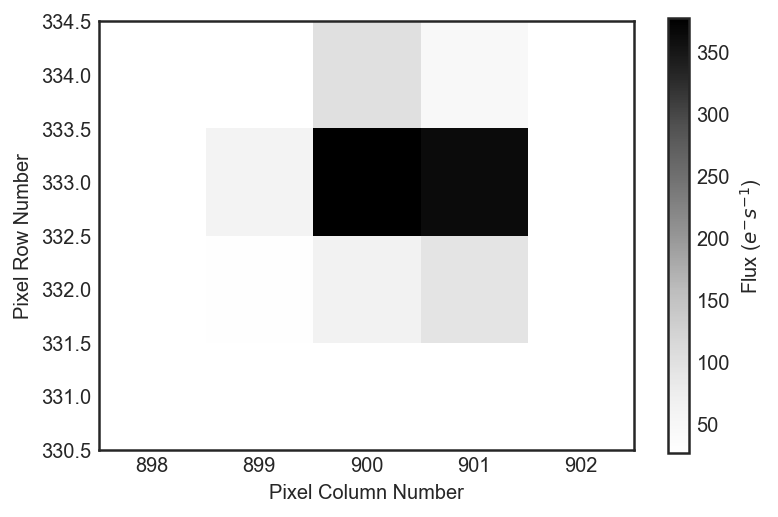

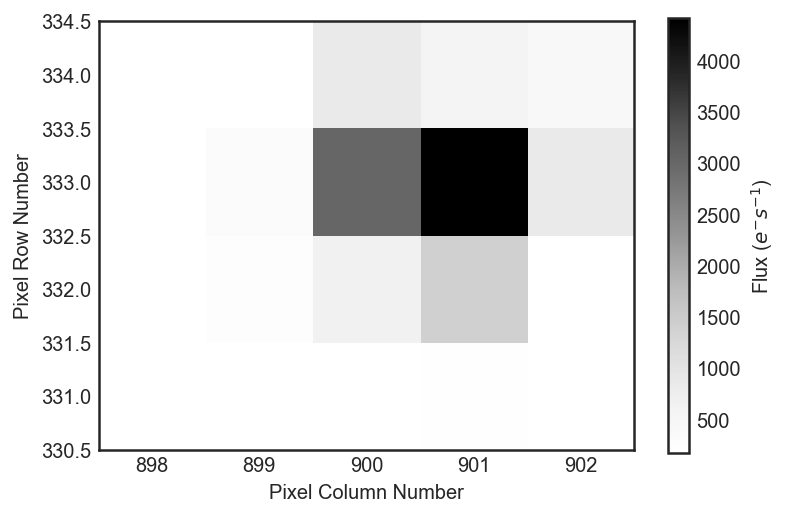

In [1107]:
for sdx, s in sources.iterrows():
    print(s.phot_g_mean_mag)
    v = np.zeros(self.mean_model.shape[0])
    v[sdx] = s.phot_g_mean_flux
    m = self.mean_model.T.dot(v)
    mod = np.zeros(tpfs[tdx].shape[1:]) * np.nan
    for jdx in range(r.shape[1]):
        for idx in range(r.shape[0]):
            l = np.where((self.row == r[idx, jdx]) & (self.column == c[idx, jdx]))[0]
            if len(l) == 0:
                continue
            mod[idx, jdx] = m[l]
    lk.utils.plot_image(mod, extent=img_extent)

[<AxesSubplot:xlabel='Time [JD]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>,
 <AxesSubplot:xlabel='Time [JD]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>]

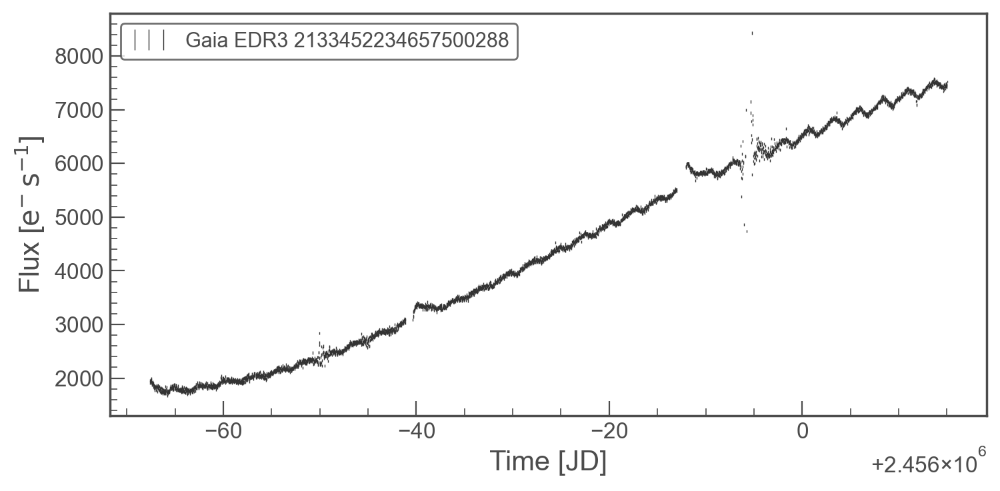

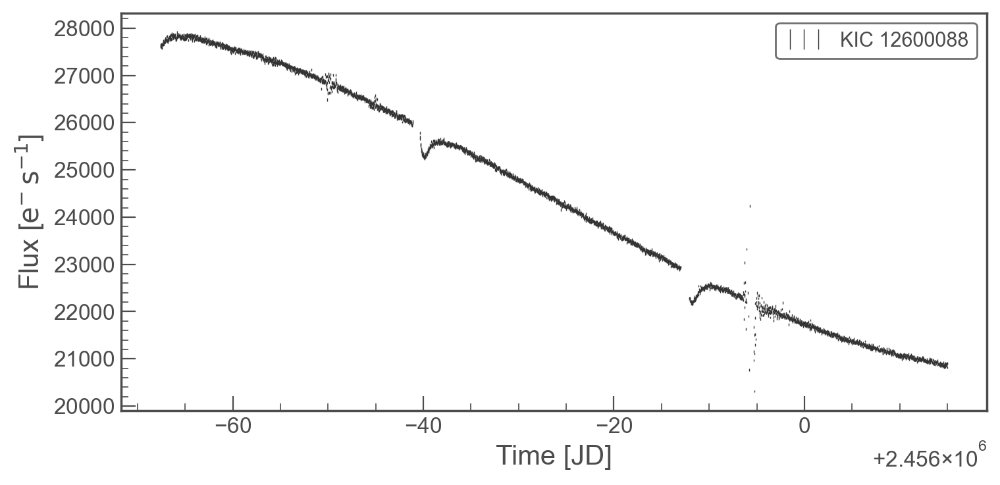

In [1108]:
[lc.errorbar() for lc in self.lcs_in_tpf(tdx)]

<AxesSubplot:xlabel='Time [JD]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>

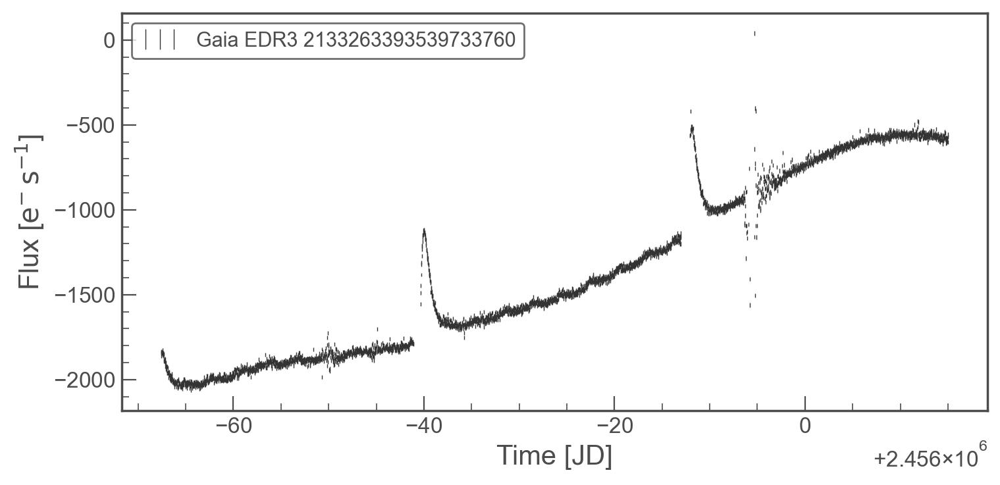

In [1045]:
self.lcs[6].errorbar()

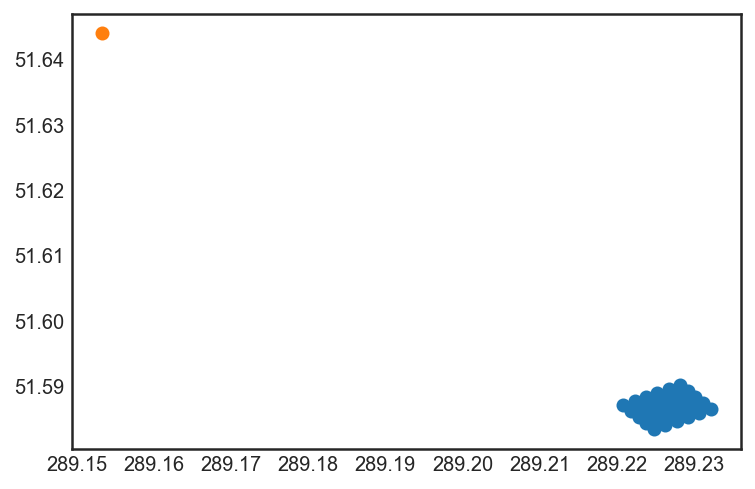

In [1046]:
plt.scatter(*tpfs[136].get_coordinates(0))
plt.scatter(s.ra, s.dec)

In [1047]:
sources = get_gaia_sources(tpf[136].ra, tpf[136].dec, 0.01)

<AxesSubplot:xlabel='Time [JD]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>

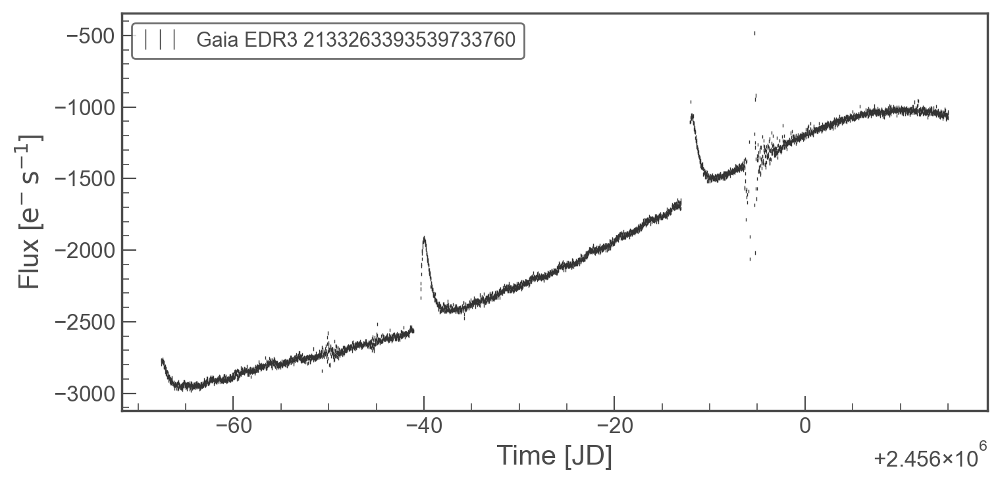

In [644]:
self.lcs_in_tpf(136)[0].errorbar()

<AxesSubplot:xlabel='Time [JD]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>

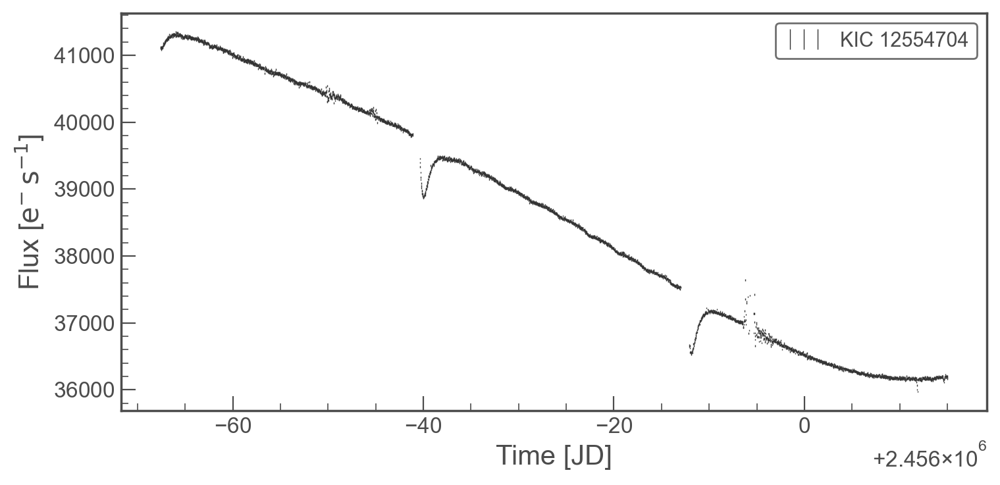

In [645]:
self.lcs_in_tpf(136)[1].errorbar()

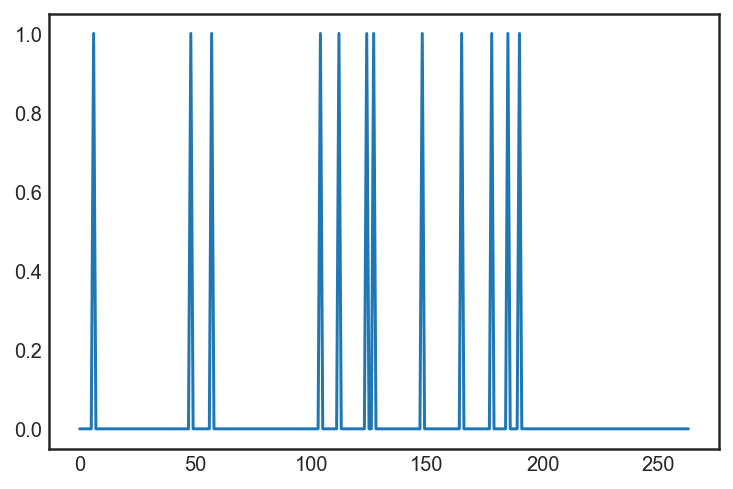

In [594]:
plt.plot((self.ws_va < 0).any(axis=0))

<AxesSubplot:xlabel='Time [JD]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>

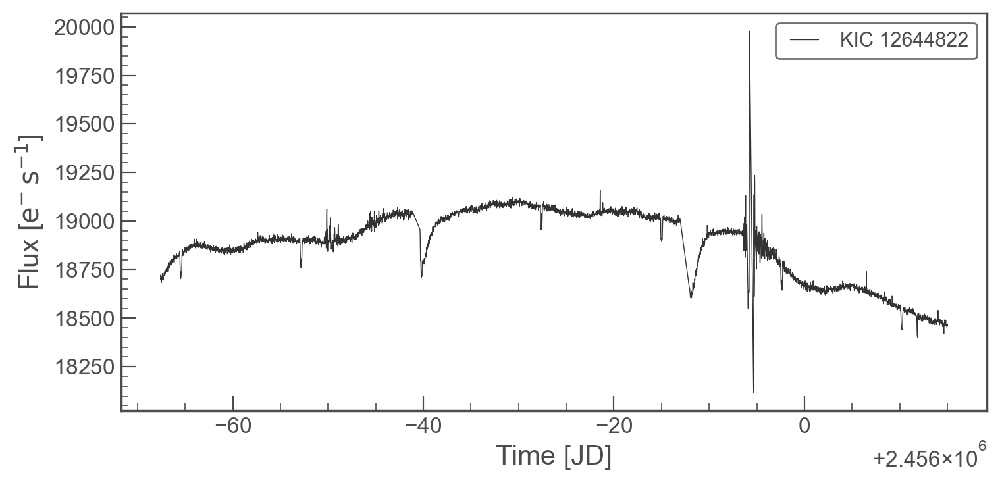

In [472]:
self.lcs_in_tpf(4)[0].plot()

<AxesSubplot:xlabel='Time - 2454833 [BKJD days]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>

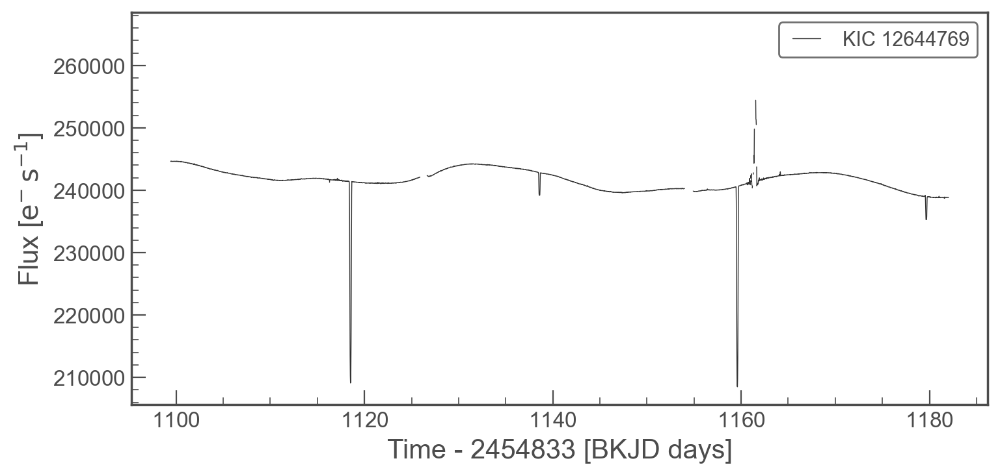

In [272]:
tpfs[0].to_lightcurve().plot()

In [307]:
qual_mask = lk.utils.KeplerQualityFlags.create_quality_mask(
    tpfs[0].quality, 1 | 2 | 4 | 8 | 32 | 16384 | 65536 | 1048576
)
qual_mask &= (np.abs(tpfs[0].pos_corr1) < 5) & (np.abs(tpfs[0].pos_corr2) < 5)

<AxesSubplot:title={'center':'Target ID: 12644769, Cadence: 48473'}, xlabel='Pixel Column Number', ylabel='Pixel Row Number'>

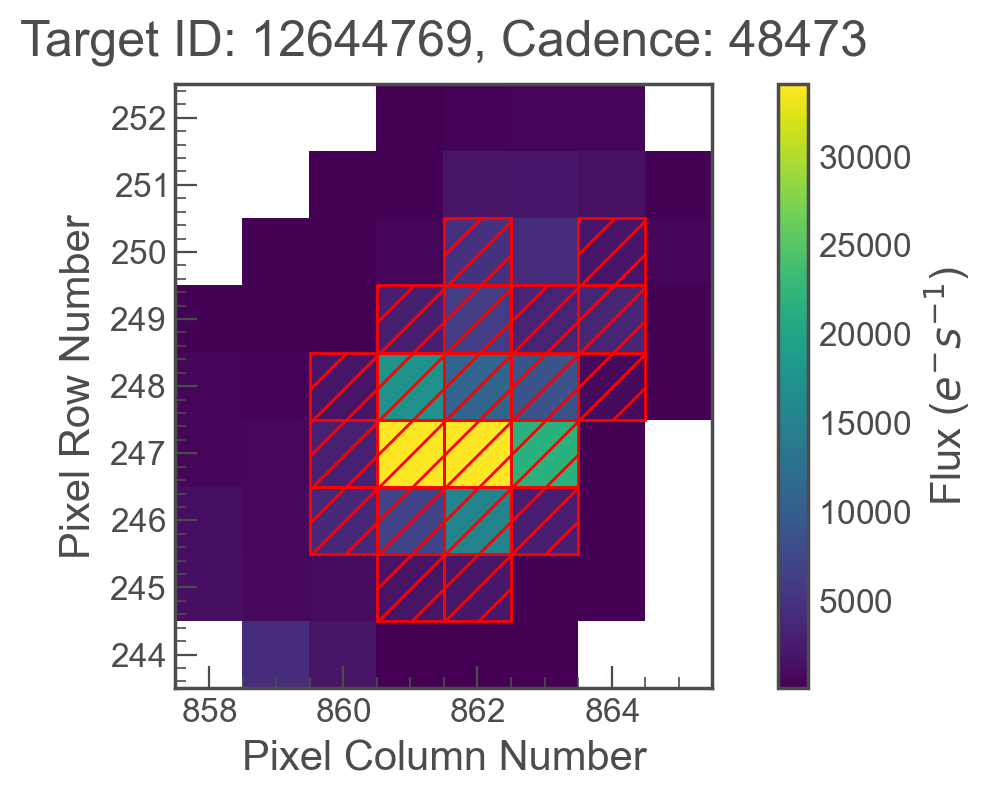

In [352]:
tpfs[0].plot(aperture_mask=tpfs[0].pipeline_mask)

<AxesSubplot:xlabel='Time [JD]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>

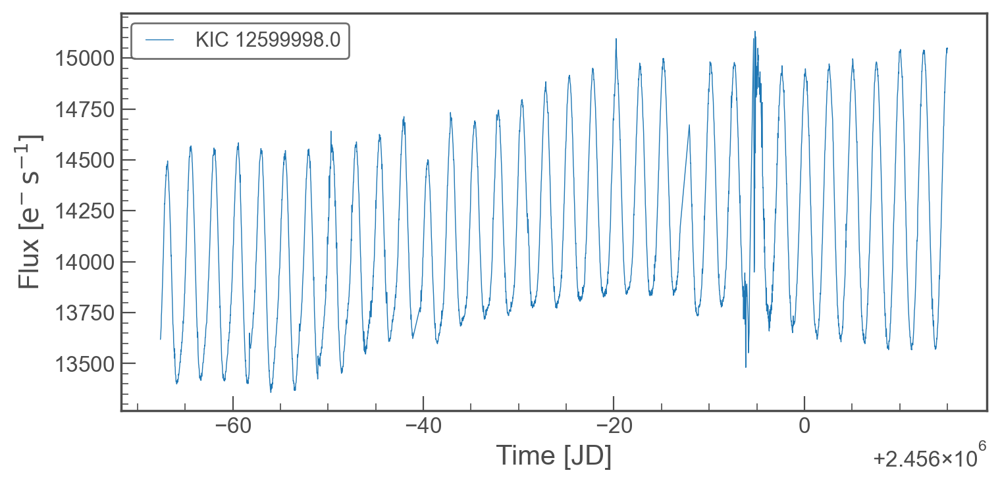

In [385]:
self.lcs_in_tpf(19).plot()

/Users/ch/Library/Caches/pypoetry/virtualenvs/psfmachine-oTpW04dh-py3.8/lib/python3.8/site-packages/lightkurve/lightcurve.py:850: LightkurveWarning: `epoch_time` appears to be given in JD, however the light curve time uses BKJD (i.e. JD - 2454833).
  warnings.warn(


(-0.4, 0.4)

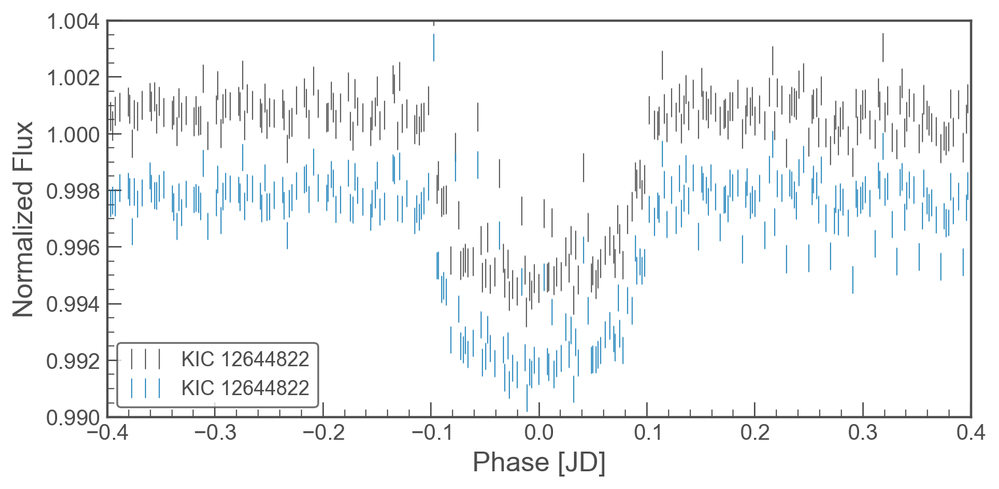

In [489]:
rlc = tpfs[4].to_lightcurve()[qual_mask].normalize().flatten(121, sigma=10, break_tolerance=10)
rlc.time += 2454833
ax = rlc.fold(12.611906672, 2455013.892444).errorbar()
clc=self.lcs_in_tpf(4)[0].normalize().flatten(121, sigma=10, break_tolerance=10)
(clc - 0.003).fold(12.611906672, 2455013.892444).errorbar(ax=ax)
plt.ylim(0.99, 1.004)
plt.xlim(-0.4, 0.4)

/Users/ch/Library/Caches/pypoetry/virtualenvs/psfmachine-oTpW04dh-py3.8/lib/python3.8/site-packages/lightkurve/lightcurve.py:483: LightkurveWarning: Two LightCurve objects with inconsistent time values are being added.
  warnings.warn(
/Users/ch/Library/Caches/pypoetry/virtualenvs/psfmachine-oTpW04dh-py3.8/lib/python3.8/site-packages/lightkurve/lightcurve.py:850: LightkurveWarning: `epoch_time` appears to be given in JD, however the light curve time uses BKJD (i.e. JD - 2454833).
  warnings.warn(


(-0.4, 0.4)

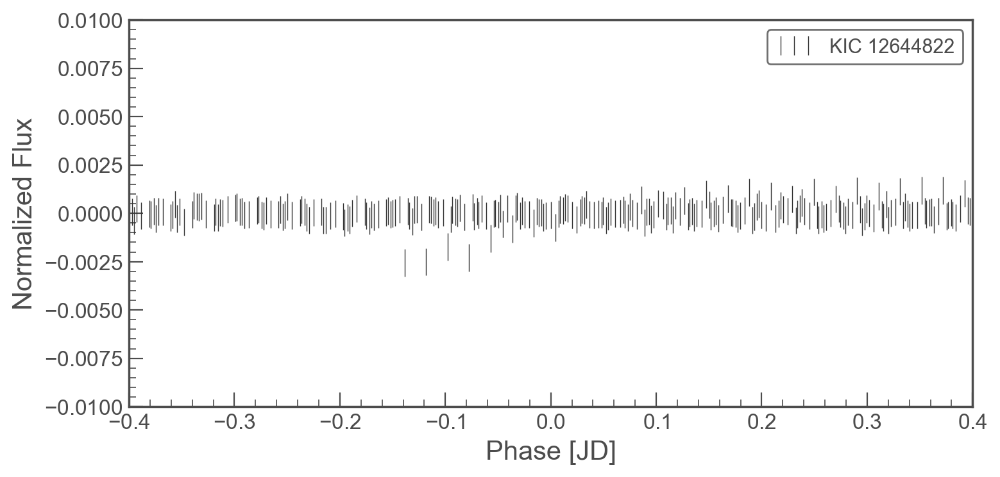

In [492]:
(rlc - clc).fold(12.611906672, 2455013.892444).errorbar()
plt.ylim(-0.01, 0.01)
plt.xlim(-0.4, 0.4)

In [426]:
#[lc.plot() for lc in self.lcs if lc.label.startswith('Gaia')]

In [581]:
dm1 = lk.designmatrix.DesignMatrix(self.ws_va, name='pca').standardize().pca(3).append_constant()
dm1 = dm1.split(list(np.where(np.diff(self.time) > 5*np.median(np.diff(self.time)))[0] + 1))
dm2 = lk.designmatrix.create_spline_matrix(self.time, n_knots=30, include_intercept=False)
dm = lk.designmatrix.DesignMatrixCollection([dm1, dm2])

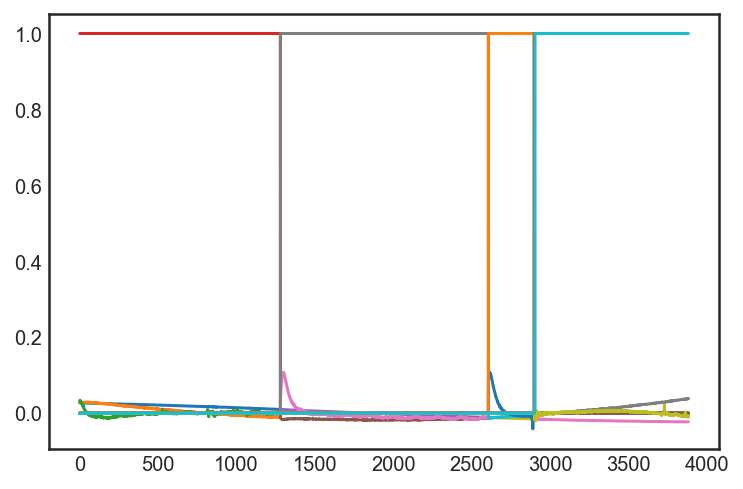

In [582]:
plt.plot(dm1.X)

In [592]:
lc = self.lcs_in_tpf(50)[0].normalize()
r = lk.correctors.RegressionCorrector(lc)
clc = r.correct(dm, sigma=3)

<AxesSubplot:xlabel='Time [JD]', ylabel='Normalized Flux'>

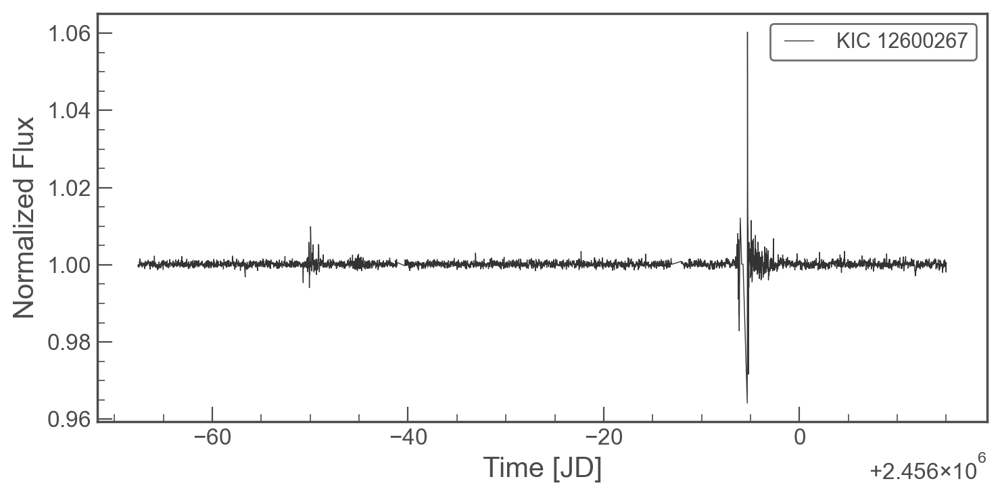

In [593]:
clc.plot()

<AxesSubplot:xlabel='Time [JD]', ylabel='Normalized Flux'>

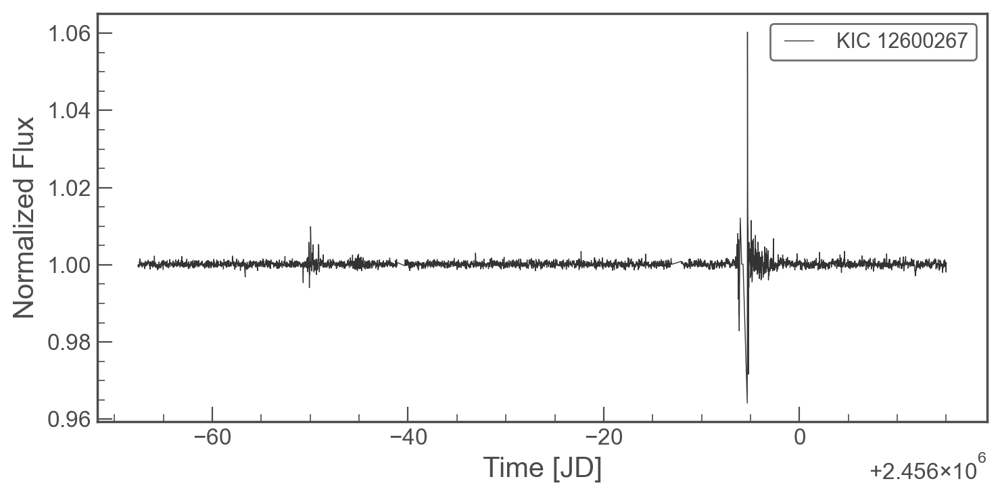

In [579]:
clc.plot()

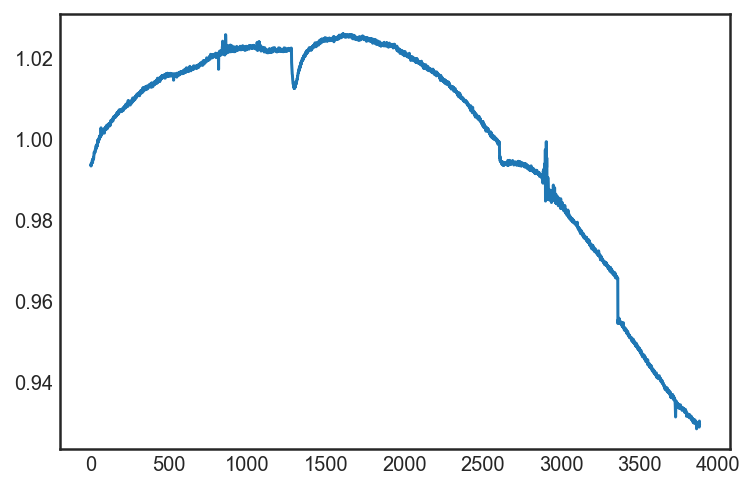

In [406]:
plt.plot((self.ws/self.ws.mean(axis=0)))

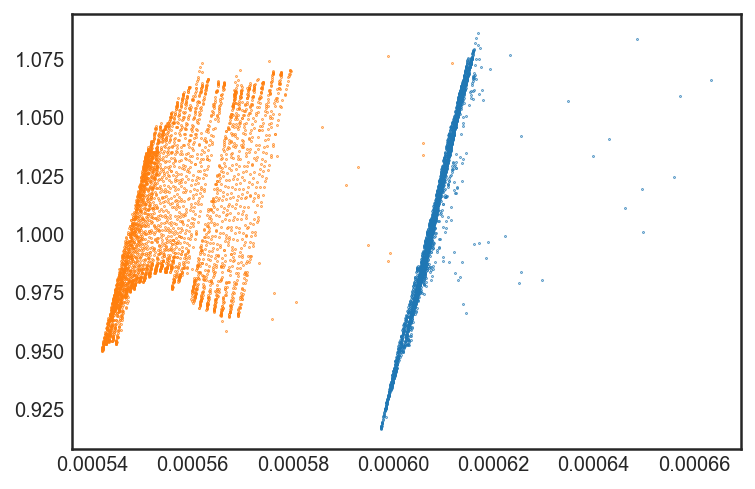

In [396]:
plt.scatter(rlc.flux_err.value, rlc.flux.value, s=0.1)
plt.scatter(clc.flux_err.value, clc.flux.value, s=0.1)

<AxesSubplot:title={'center':'Target ID: 12644822, Cadence: 48473'}, xlabel='Pixel Column Number', ylabel='Pixel Row Number'>

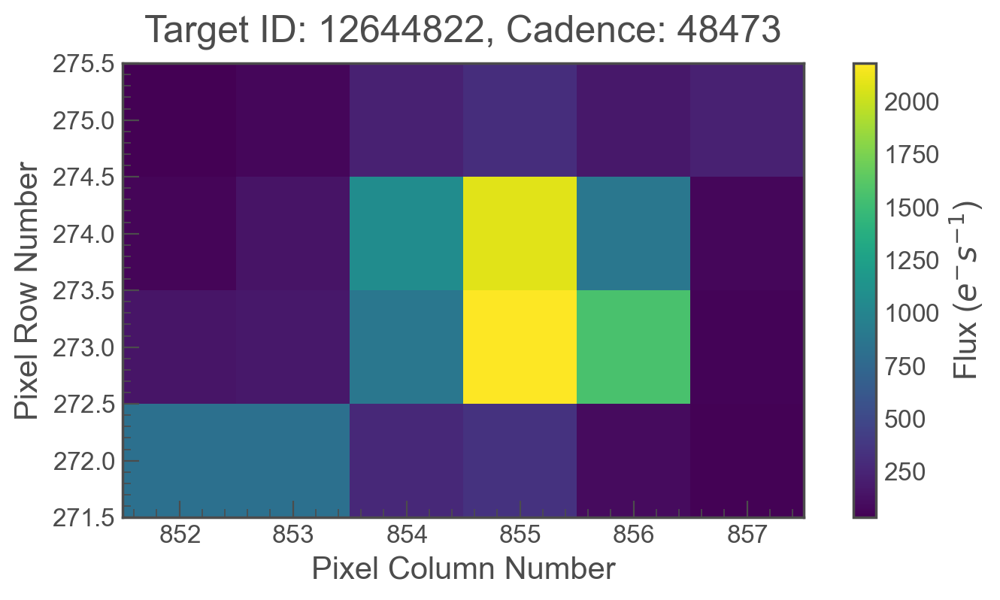

In [324]:
tpfs[4].plot()

(0.97, 1.03)

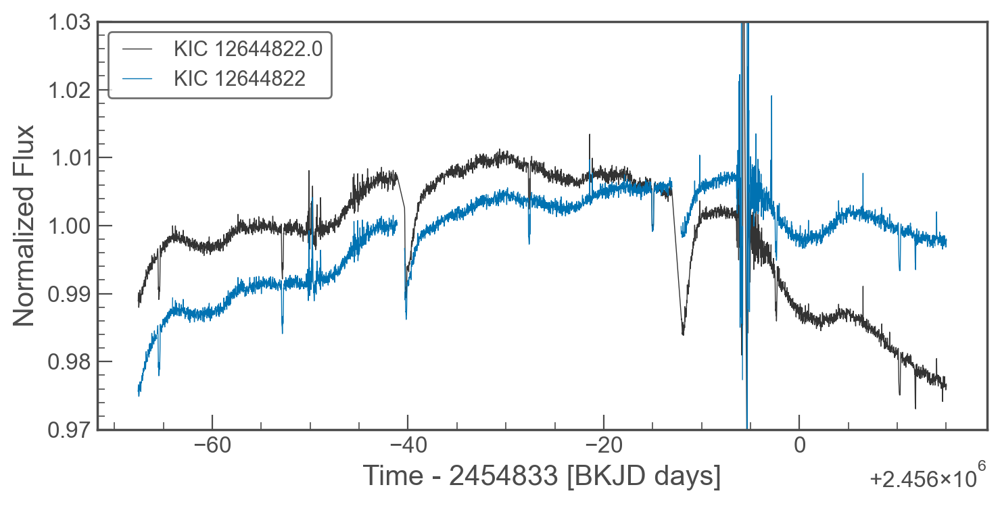

In [332]:
ax = self.lcs_in_tpf(4)[0].normalize().plot()
rlc = tpfs[4].to_lightcurve().normalize()
rlc.time += 2454833
rlc.plot(ax=ax)
plt.ylim(0.97, 1.03)

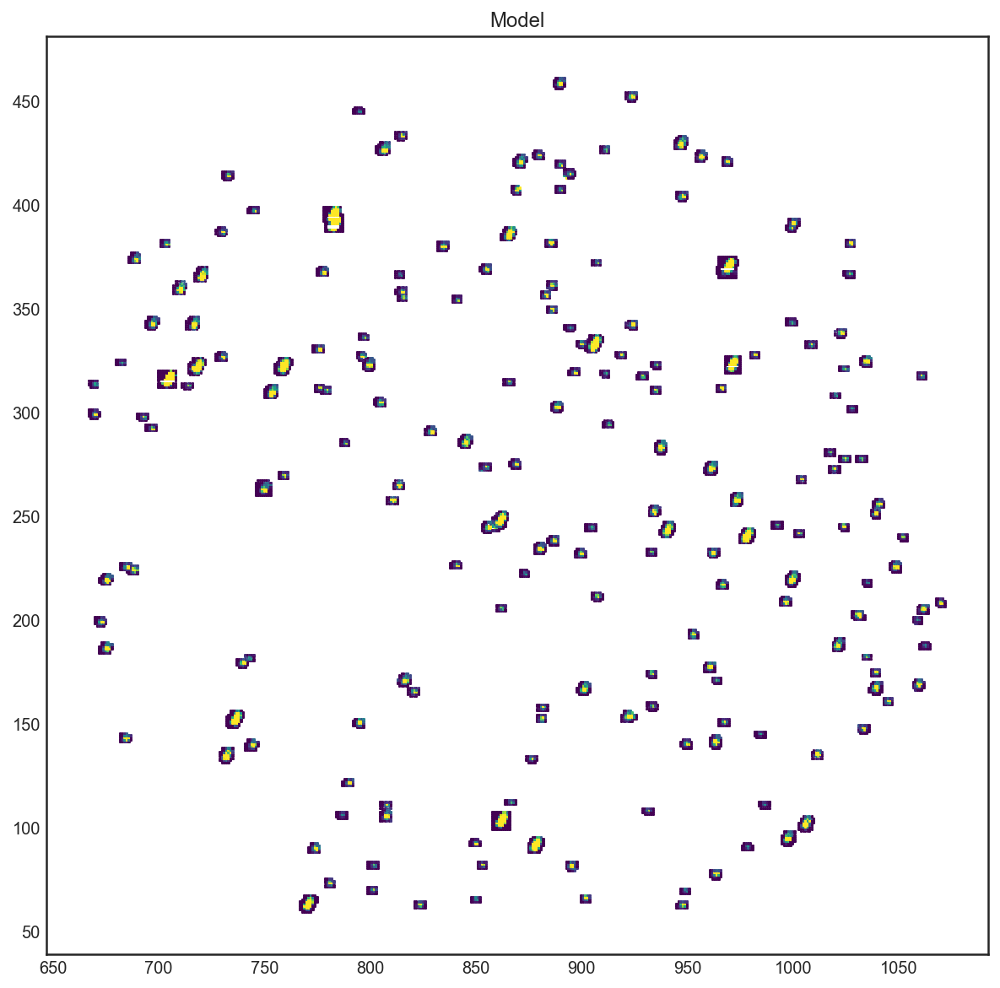

In [346]:
from matplotlib import animation
r = (self.flux - self.model_flux)[np.linspace(0, self.nt-1, 50, dtype=int)]
fig, ax = plt.subplots(figsize=(10, 10))
im = ax.scatter(self.column, self.row, c=self.model_flux[0], s=0.5, vmin=0, vmax=3000, cmap='viridis', marker='s')
ax.set_title('Model')
r = np.linspace(0, self.nt - 1, 50, dtype=int)
def update(i):
    im.set_array(self.model_flux[r[i]])
    return im,

anim = animation.FuncAnimation(fig, update, frames=50, blit=True)
anim.save('model.mp4')

array([   0.        ,   79.28571429,  158.57142857,  237.85714286,
        317.14285714,  396.42857143,  475.71428571,  555.        ,
        634.28571429,  713.57142857,  792.85714286,  872.14285714,
        951.42857143, 1030.71428571, 1110.        , 1189.28571429,
       1268.57142857, 1347.85714286, 1427.14285714, 1506.42857143,
       1585.71428571, 1665.        , 1744.28571429, 1823.57142857,
       1902.85714286, 1982.14285714, 2061.42857143, 2140.71428571,
       2220.        , 2299.28571429, 2378.57142857, 2457.85714286,
       2537.14285714, 2616.42857143, 2695.71428571, 2775.        ,
       2854.28571429, 2933.57142857, 3012.85714286, 3092.14285714,
       3171.42857143, 3250.71428571, 3330.        , 3409.28571429,
       3488.57142857, 3567.85714286, 3647.14285714, 3726.42857143,
       3805.71428571, 3885.        ])

In [181]:
print(''.join([f'{lcc0.label}\n' for lcc0 in lcc]))

KIC 5563598
Gaia EDR3 2075109738217441280
Gaia EDR3 2075109742528910720
Gaia EDR3 2075121489247964800
Gaia EDR3 2075121493547341184
Gaia EDR3 2075121493559430016
Gaia EDR3 2075121493559433984
Gaia EDR3 2075121493559437184
Gaia EDR3 2075121493559439744
Gaia EDR3 2075121768437337856



[<AxesSubplot:xlabel='Time [JD]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>,
 <AxesSubplot:xlabel='Time [JD]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>]

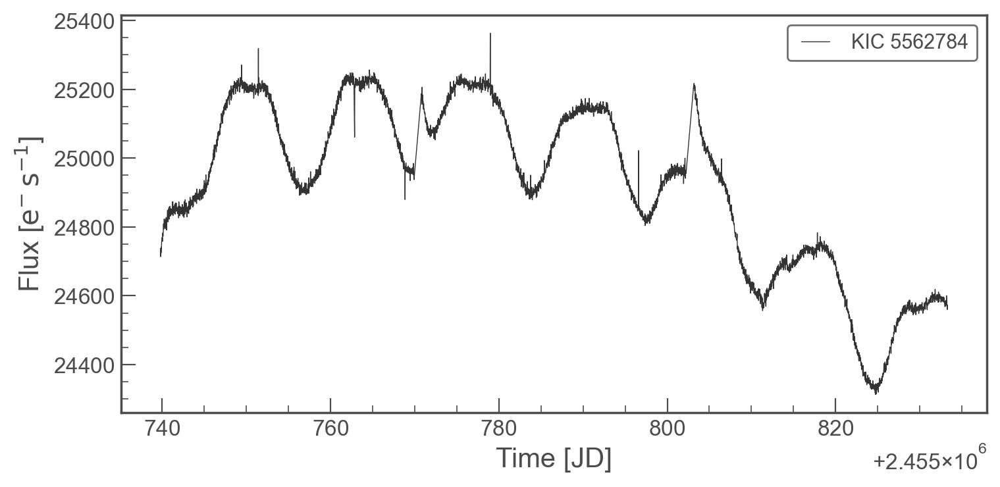

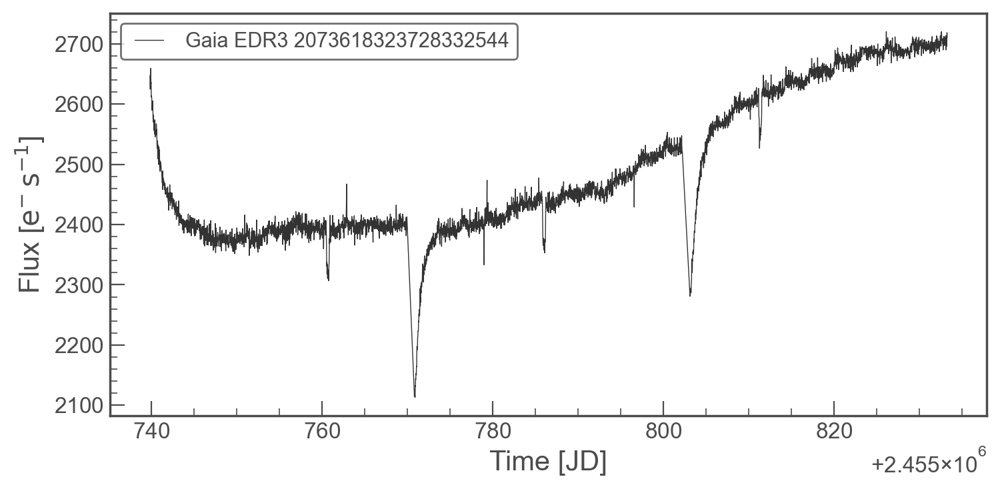

In [209]:
[lc.plot() for lc in self.lcs_in_tpf(0)]

In [141]:
lk.LightCurveCollection(self.lcs)

LightCurveCollection of 532 objects:
	Gaia EDR3 2073599455917799680 (1 KeplerLightCurves) None: 0
	Gaia EDR3 2073604541159036288 (1 KeplerLightCurves) None: 0
	Gaia EDR3 2073604575518759040 (1 KeplerLightCurves) None: 0
	Gaia EDR3 2073604579832468736 (1 KeplerLightCurves) None: 0
	Gaia EDR3 2073604579832470144 (1 KeplerLightCurves) None: 0
	Gaia EDR3 2073604747317629440 (1 KeplerLightCurves) None: 0
	Gaia EDR3 2073604751631203328 (1 KeplerLightCurves) None: 0
	Gaia EDR3 2073604751631679872 (1 KeplerLightCurves) None: 0
	Gaia EDR3 2073604816037081600 (1 KeplerLightCurves) None: 0
	Gaia EDR3 2073604854710424576 (1 KeplerLightCurves) None: 0
	Gaia EDR3 2073604854710425216 (1 KeplerLightCurves) None: 0
	Gaia EDR3 2073604987835757696 (1 KeplerLightCurves) None: 0
	Gaia EDR3 2073604992149356800 (1 KeplerLightCurves) None: 0
	Gaia EDR3 2073605026509579264 (1 KeplerLightCurves) None: 0
	Gaia EDR3 2073605026509580928 (1 KeplerLightCurves) None: 0
	Gaia EDR3 2073605026509587072 (1 KeplerLightCur

In [116]:
(np.hstack(self.tpf_meta['sources']) == 37).any()

False

,designation,ra,ra_error,dec,dec_error,parallax,parallax_error,pmra,pmra_error,pmdec,...,phot_bp_n_obs,phot_bp_mean_flux,phot_bp_mean_flux_error,phot_bp_mean_mag,phot_rp_n_obs,phot_rp_mean_flux,phot_rp_mean_flux_error,phot_rp_mean_mag,clean_flag,kic
0,Gaia EDR3 2073604541159036288,298.885922,0.072010,40.583822,0.080323,0.552806,0.087444,-3.973450,0.096295,-5.164586,...,45,480.823836,6.691113,18.633577,44,1002.643784,6.163546,17.245029,0,None
1,Gaia EDR3 2073604545472719616,298.884797,0.013697,40.582317,0.015528,0.609951,0.016605,-1.926271,0.017961,-4.540617,...,45,14881.836059,15.640560,14.906901,46,17219.417528,13.486052,14.157849,0,5391847
2,Gaia EDR3 2073604575518759040,298.916260,0.059908,40.581366,0.067642,0.329168,0.072251,-1.442204,0.081449,-0.460297,...,45,745.995113,8.494766,18.156702,45,1276.062193,5.975596,16.983215,0,None
3,Gaia EDR3 2073604579832468736,298.907909,0.058834,40.581098,0.062937,0.064930,0.070052,-1.711571,0.078818,-2.741988,...,47,710.623856,5.874833,18.209442,46,1510.705762,7.554215,16.799946,0,None
4,Gaia EDR3 2073604579832470144,298.908414,0.046315,40.583125,0.051660,0.761855,0.055946,-9.809623,0.062184,-18.091885,...,44,1083.176448,7.573110,17.751795,44,2217.885266,7.011027,16.383047,0,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
527,Gaia EDR3 2075121493559430016,298.996785,0.027577,40.831632,0.032015,0.398485,0.034847,-3.834492,0.036893,-4.609552,...,39,3168.584212,7.590812,16.586380,37,4929.903847,10.970513,15.515800,0,None
528,Gaia EDR3 2075121493559433984,299.000602,0.045713,40.832564,0.052366,-0.042573,0.057796,-2.182267,0.060921,-3.352288,...,37,1041.211257,4.678828,17.794695,39,2329.382822,6.244305,16.329794,0,None
529,Gaia EDR3 2075121493559437184,299.008317,0.022757,40.827177,0.029215,0.337649,0.028962,-1.532073,0.029500,-3.174888,...,35,5739.136743,12.055212,15.941425,35,8164.624689,14.432553,14.968055,0,None
530,Gaia EDR3 2075121493559439744,299.004643,0.026704,40.835021,0.031249,1.322063,0.033924,-0.957551,0.035404,-16.582420,...,36,3033.980873,10.710981,16.633511,37,5608.024944,9.965142,15.375871,0,None


/Users/ch/Projects/ADAP/science/psf-modeling/psfmachine/psfmachine/machine.py:300: RuntimeWarning: divide by zero encountered in log10
  f = np.log10((temp_mask.astype(float) * mean_flux))
/Users/ch/Projects/ADAP/science/psf-modeling/psfmachine/psfmachine/machine.py:300: RuntimeWarning: invalid value encountered in log10
  f = np.log10((temp_mask.astype(float) * mean_flux))
/Users/ch/Projects/ADAP/science/psf-modeling/psfmachine/psfmachine/machine.py:710: RuntimeWarning: invalid value encountered in log10
  mean_f = np.log10(
/Users/ch/Projects/ADAP/science/psf-modeling/psfmachine/psfmachine/machine.py:726: RuntimeWarning: invalid value encountered in sqrt
  .multiply((f ** 0.5) / (f * np.log(10)))
/Users/ch/Library/Caches/pypoetry/virtualenvs/psfmachine-oTpW04dh-py3.8/lib/python3.8/site-packages/scipy/sparse/_index.py:125: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


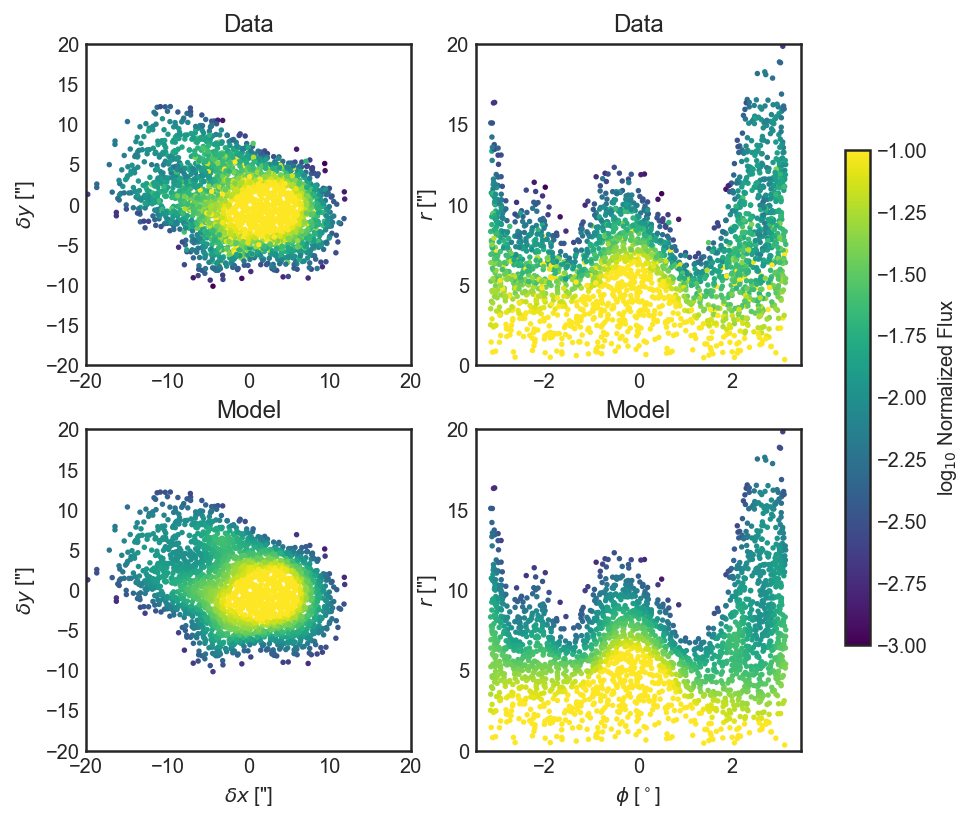

In [18]:
self.build_shape_model(plot=True, flux_cut_off=1);

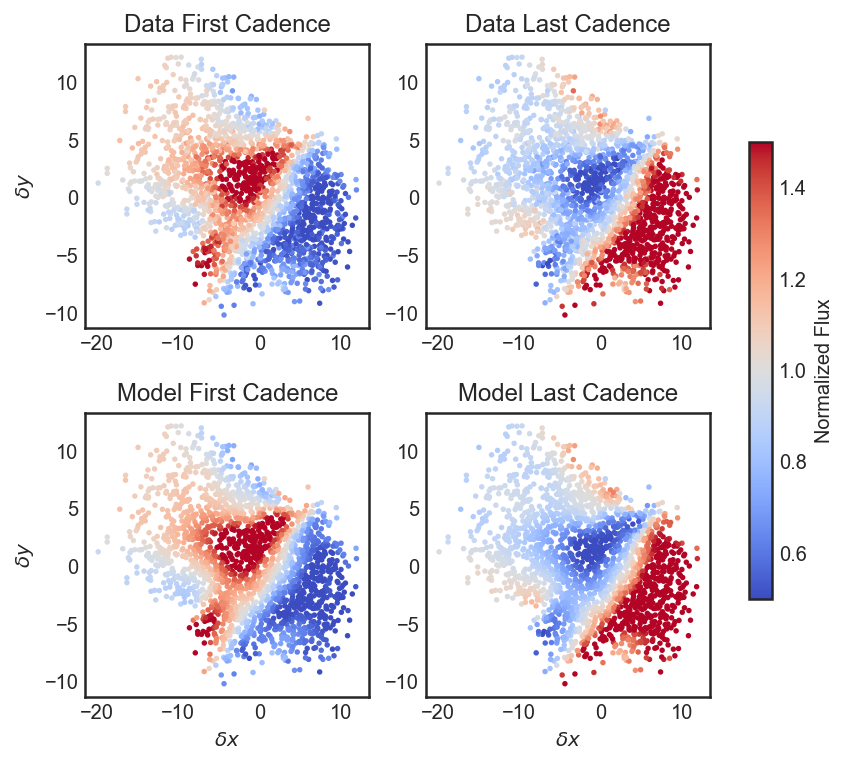

In [20]:
self.build_time_model(plot=True);

In [ ]:
self.fit_model(fit_va=True)

In [ ]:
r, d, k, i = np.asarray([(tpf.ra, tpf.dec, tpf.header['kepmag'], tpf.targetid) for tpf in clipped_tpfs]).T
tpf_meta = {'ra':r, 'dec':d, 'kepmag':k, 'kic':i}

In [21]:
self.tpf_meta

{'ra': array([298.86973, 298.87209, 298.859, 298.87925, 298.89186, 298.892,
        298.84163, 298.83831, 298.86971, 298.90533, 298.87616, 298.86128,
        298.850651, 298.88423, 298.84368, 298.90445, 298.83956, 298.82312,
        298.917581, 298.88388, 298.86759, 298.9185, 298.91, 298.8504,
        298.91715, 298.92021, 298.81431, 298.923611, 298.87973, 298.81791,
        298.93026, 298.835081, 298.93559, 298.93455, 298.92576, 298.94189,
        298.79537, 298.92386, 298.86272, 298.80924, 298.87986, 298.91151,
        298.8756, 298.89285, 298.91451, 298.90254, 298.93769, 298.80807,
        298.96604, 298.88268, 298.94871, 298.780091, 298.76433, 298.834811,
        298.95594, 298.828421, 298.76352, 298.76025, 298.96854, 298.858541,
        298.95666, 298.862681, 298.78841, 298.76334, 298.87497, 298.786751,
        298.75332, 298.925348, 298.78299, 298.76271, 298.81475, 298.9802,
        298.94913, 298.76382, 298.870901, 298.77558, 298.965911, 298.89732,
        298.74591, 298.99083, 

In [ ]:
from astropy.coordinates import SkyCoord, match_coordinates_sky
idx, sep, _ = match_coordinates_sky(SkyCoord(tpf_meta['ra'], tpf_meta['dec'], unit='deg'), SkyCoord(np.asarray(self.sources[['ra', 'dec']]), unit='deg'))
match = (sep < 1*u.arcsec) & np.asarray(np.abs(self.sources['phot_g_mean_mag'][idx] - tpf_meta['kepmag']) < 0.25)
self.sources['kic'] = None
self.sources.loc[idx[match], 'kic'] = np.asarray(tpf_meta['kic'])[match]

In [ ]:
import astropy.units as u
for pdx in np.arange(0, len(clipped_tpfs)):
    tpf = clipped_tpfs[pdx]
    tpfra, tpfdec = tpf.get_coordinates(0)
    s1 = self.sources[((np.abs(tpfra.ravel() - self.sources.ra[:, None]) < 6*u.arcsecond.to(u.deg)) & (np.abs(tpfdec.ravel() - self.sources.dec[:, None]) < 6*u.arcsecond.to(u.deg))).any(axis=1)]

    fig = plt.figure(figsize=(8, 1 * len(s1)), facecolor='w')
    ax0 = plt.subplot2grid((len(s1), 4), (0, 3), rowspan=len(s1))
    tpf.plot(ax=ax0, show_colorbar=False, cmap='Greys_r')
    ax0.set(title=f'Kepler TPF\nKIC {tpf.targetid}')

    idx = 0
    for sdx, s in s1.iterrows():
        idx = np.where(s1.index == sdx)[0][0]
        r, c = tpf.wcs.wcs_world2pix(np.asarray([[s.ra, s.dec]]), 0)[0]
        c += tpf.row
        r += tpf.column
        ax0.scatter(r, c, c=f'C{idx}', edgecolor='k')
        ax = plt.subplot2grid((len(s1), 4), (idx, 0), colspan=3)
        ax.plot(self.time, self.ws[:, sdx], c=f'C{idx}', alpha=0.3)
        ax.plot(self.time, self.ws_va[:, sdx], c=f'C{idx}', label=s.designation)
        ax.legend()
        ax.set(ylabel='Flux [$e^-s^{-1}$]')
        if idx != (len(s1) - 1):
            ax.set(xticklabels=[])
        
        print(s.kic)
        if s.kic is not None:
            label, targetid = f'KIC {s.kic}', s.kic
        else:
            label, targetid = s.designation, int(s.designation.split(' ')[-1])
        print(label)
        vals = ['PSFMACHINE', 'PSF', label, targetid, tpf.channel, tpf.campaign, tpf.quarter, tpf.mission, s.ra, s.dec, s.pmra/1000, s.pmdec/1000, s.parallax, s.phot_g_mean_mag]
        keys = ['ORIGIN', 'APERTURE', 'LABEL', 'TARGETID', 'CHANNEL', 'CAMPAIGN', 'QUARTER', 'MISSION', 'RA', 'DEC', 'PMRA', 'PMDEC', 'PARALLAX', 'GMAG', 'RPMAG', 'BPMAG', 'TEFF', 'RADIUS']
        meta = {key:val for val, key in zip(vals, keys)}

        lc = lk.KeplerLightCurve(time=(self.time)*u.d, flux=(self.ws_va[:, sdx])*u.electron/u.second, flux_err=self.werrs_va[:, sdx]*u.electron/u.second, meta=meta, time_format='jd')

        idx += 1
        break
    ax.set(xlabel='Time [JD]')
    plt.subplots_adjust(wspace=0.45)
    break 

In [81]:
lcs = []
for idx, s in self.sources.iterrows():
    if s.kic is not None:
        label, targetid = f'KIC {s.kic}', s.kic
    else:
        label, targetid = s.designation, int(s.designation.split(' ')[-1])
    vals = ['PSFMACHINE', 'PSF', label, targetid, tpf.channel, tpf.campaign, tpf.quarter, tpf.mission, s.ra, s.dec, s.pmra/1000, s.pmdec/1000, s.parallax, s.phot_g_mean_mag]
    keys = ['ORIGIN', 'APERTURE', 'LABEL', 'TARGETID', 'CHANNEL', 'CAMPAIGN', 'QUARTER', 'MISSION', 'RA', 'DEC', 'PMRA', 'PMDEC', 'PARALLAX', 'GMAG', 'RPMAG', 'BPMAG', 'TEFF', 'RADIUS']
    meta = {key:val for val, key in zip(vals, keys)}
    lcs.append(lk.KeplerLightCurve(time=(self.time)*u.d, flux=(self.ws_va[:, sdx])*u.electron/u.second, flux_err=self.werrs_va[:, sdx]*u.electron/u.second, meta=meta, time_format='jd'))

Gaia EDR3 2073604541159036288


AttributeError: 'TPFMachine' object has no attribute 'ws_va'

In [75]:
self.tpf_meta['kic']

array([5562784, 5562796, 5562723, 5562842, 5562912, 5562913, 5562625,
       5562598, 5477312, 5563000, 5477340, 5562735, 5477219, 5477386,
       5562635, 5562995, 5562613, 5562532, 5563057, 5477381, 5562776,
       5563059, 5563024, 5562669, 5563056, 5477570, 5477012, 5563080,
       5477357, 5562507, 5477630, 5562583, 5477660, 5477655, 5477601,
       5477694, 5562396, 5477590, 5477282, 5562465, 5477358, 5477529,
       5477337, 5477436, 5563041, 5477484, 5477673, 5562457, 5563289,
       5477370, 5477737, 5476815, 5562249, 5562580, 5477766, 5562547,
       5476729, 5562224, 5563301, 5477259, 5563244, 5477281, 5476864,
       5562244, 5648820, 5476854, 5562185, 5477596, 5476835, 5562238,
       5477014, 5477898, 5563209, 5476731, 5477315, 5476790, 5563287,
       5477460, 5562149, 5477964, 5648562, 5562100, 5476920, 5476793,
       5476671, 5477406, 5476681, 5478010, 5562069, 5477524, 5477741,
       5563300, 5648479, 5563343, 5563387, 5477520, 5476871, 5648556,
       5478025, 5477

In [ ]:
lc.plot()

In [45]:
(np.abs(tpfra.ravel() - np.asarray(self.sources.ra)[:, None]))

array([[0.20213529, 0.20342679, 0.20471827, ..., 0.20674081, 0.20803231,
        0.20932379],
       [0.20101037, 0.20230187, 0.20359335, ..., 0.20561589, 0.20690739,
        0.20819887],
       [0.23247322, 0.23376472, 0.2350562 , ..., 0.23707874, 0.23837025,
        0.23966173],
       ...,
       [0.32452982, 0.32582132, 0.3271128 , ..., 0.32913534, 0.33042684,
        0.33171832],
       [0.32085603, 0.32214753, 0.32343901, ..., 0.32546155, 0.32675305,
        0.32804453],
       [0.30188275, 0.30317425, 0.30446573, ..., 0.30648828, 0.30777978,
        0.30907126]])

In [67]:
import astropy.units as u


In [53]:
np.hstack(source2tpf)

(657,)

In [59]:
source2tpf

[array([353, 360]),
 array([342]),
 array([352]),
 array([358, 359, 361, 362, 363]),
 array([345, 346, 347, 350, 351]),
 array([346, 348, 349, 350]),
 array([354, 356]),
 array([355, 357]),
 array([334, 335, 336, 340, 341]),
 array([343]),
 array([335, 336]),
 array([365, 366, 367, 368]),
 array([326, 327]),
 array([339]),
 array([389, 391]),
 array([110, 111, 112, 113, 114]),
 array([388, 389, 390, 391, 395]),
 array([373, 374]),
 array([116, 172, 173, 174, 344]),
 array([337]),
 array([369]),
 array([119]),
 array([415, 417]),
 array([394, 396, 397]),
 array([105, 115, 117, 118, 119]),
 array([], dtype=int64),
 array([105, 106, 115, 118]),
 array([328, 329, 330, 331]),
 array([412, 413, 414, 418, 419]),
 array([101]),
 array([393]),
 array([ 92, 103, 107, 109]),
 array([398, 399, 400]),
 array([ 92, 104, 107, 108, 167, 168, 169, 171]),
 array([ 92, 104, 107, 108, 167]),
 array([ 88,  89,  90,  91,  93, 109]),
 array([168, 169, 170, 171]),
 array([385, 386, 387]),
 array([91]),
 array

In [ ]:
idx[match]

In [ ]:
lc.plot()

In [ ]:
import pickle

In [ ]:
pickle.dump(lc, open('koi-608_dr3.p', 'wb'))